In [ ]:
!pip install matplotlib-venn

In [ ]:
pip install numpy scipy scikit-learn

In [ ]:
pip install --upgrade scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 74.5 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2


In [ ]:
from sklearn import metrics
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
# Recover default matplotlib settings
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
# settings to display all columns
pd.set_option("display.max_columns", None)
# display the dataframe head
from pylab import rcParams
from plotly import tools
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff
import statsmodels.api as sm
from numpy.random import normal, seed
from scipy.stats import norm
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima_model import ARIMA
import math
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score
from sklearn import metrics

Importing dataset

In [ ]:
df = pd.read_csv('/content/energydata_complete.csv')
df

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,45.566667,17.166667,55.200000,7.026667,84.256667,17.200000,41.626667,18.2000,48.900000,17.033333,45.5300,6.600000,733.5,92.000000,7.000000,63.000000,5.300000,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,45.992500,17.166667,55.200000,6.833333,84.063333,17.200000,41.560000,18.2000,48.863333,17.066667,45.5600,6.483333,733.6,92.000000,6.666667,59.166667,5.200000,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,45.890000,17.166667,55.090000,6.560000,83.156667,17.200000,41.433333,18.2000,48.730000,17.000000,45.5000,6.366667,733.7,92.000000,6.333333,55.333333,5.100000,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,45.723333,17.166667,55.090000,6.433333,83.423333,17.133333,41.290000,18.1000,48.590000,17.000000,45.4000,6.250000,733.8,92.000000,6.000000,51.500000,5.000000,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,45.530000,17.200000,55.090000,6.366667,84.893333,17.200000,41.230000,18.1000,48.590000,17.000000,45.4000,6.133333,733.9,92.000000,5.666667,47.666667,4.900000,10.084097,10.084097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.700000,45.590000,23.200000,52.400000,24.796667,1.000000,24.500000,44.500000,24.7000,50.074000,23.200000,46.7900,22.733333,755.2,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812
19731,2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.700000,45.590000,23.230000,52.326667,24.196667,1.000000,24.557143,44.414286,24.7000,49.790000,23.200000,46.7900,22.600000,755.2,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940
19732,2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.700000,45.730000,23.230000,52.266667,23.626667,1.000000,24.540000,44.400000,24.7000,49.660000,23.200000,46.7900,22.466667,755.2,56.333333,3.666667,25.333333,13.266667,29.199117,29.199117
19733,2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.700000,45.790000,23.200000,52.200000,22.433333,1.000000,24.500000,44.295714,24.6625,49.518750,23.200000,46.8175,22.333333,755.2,56.666667,3.833333,26.166667,13.233333,6.322784,6.322784


In [ ]:
df

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,45.566667,17.166667,55.200000,7.026667,84.256667,17.200000,41.626667,18.2000,48.900000,17.033333,45.5300,6.600000,733.5,92.000000,7.000000,63.000000,5.300000,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,45.992500,17.166667,55.200000,6.833333,84.063333,17.200000,41.560000,18.2000,48.863333,17.066667,45.5600,6.483333,733.6,92.000000,6.666667,59.166667,5.200000,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,45.890000,17.166667,55.090000,6.560000,83.156667,17.200000,41.433333,18.2000,48.730000,17.000000,45.5000,6.366667,733.7,92.000000,6.333333,55.333333,5.100000,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,45.723333,17.166667,55.090000,6.433333,83.423333,17.133333,41.290000,18.1000,48.590000,17.000000,45.4000,6.250000,733.8,92.000000,6.000000,51.500000,5.000000,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,45.530000,17.200000,55.090000,6.366667,84.893333,17.200000,41.230000,18.1000,48.590000,17.000000,45.4000,6.133333,733.9,92.000000,5.666667,47.666667,4.900000,10.084097,10.084097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.700000,45.590000,23.200000,52.400000,24.796667,1.000000,24.500000,44.500000,24.7000,50.074000,23.200000,46.7900,22.733333,755.2,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812
19731,2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.700000,45.590000,23.230000,52.326667,24.196667,1.000000,24.557143,44.414286,24.7000,49.790000,23.200000,46.7900,22.600000,755.2,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940
19732,2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.700000,45.730000,23.230000,52.266667,23.626667,1.000000,24.540000,44.400000,24.7000,49.660000,23.200000,46.7900,22.466667,755.2,56.333333,3.666667,25.333333,13.266667,29.199117,29.199117
19733,2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.700000,45.790000,23.200000,52.200000,22.433333,1.000000,24.500000,44.295714,24.6625,49.518750,23.200000,46.8175,22.333333,755.2,56.666667,3.833333,26.166667,13.233333,6.322784,6.322784


In [ ]:
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [ ]:
df.tail()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
19730,2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.7,45.590000,23.20,52.400000,24.796667,1.0,24.500000,44.500000,24.7000,50.07400,23.2,46.7900,22.733333,755.2,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812
19731,2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.7,45.590000,23.23,52.326667,24.196667,1.0,24.557143,44.414286,24.7000,49.79000,23.2,46.7900,22.600000,755.2,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940
19732,2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.7,45.730000,23.23,52.266667,23.626667,1.0,24.540000,44.400000,24.7000,49.66000,23.2,46.7900,22.466667,755.2,56.333333,3.666667,25.333333,13.266667,29.199117,29.199117
19733,2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.7,45.790000,23.20,52.200000,22.433333,1.0,24.500000,44.295714,24.6625,49.51875,23.2,46.8175,22.333333,755.2,56.666667,3.833333,26.166667,13.233333,6.322784,6.322784
19734,2016-05-27 18:00:00,430,10,25.500000,46.600000,25.264286,42.971429,26.823333,41.156667,24.7,45.963333,23.20,52.200000,21.026667,1.0,24.500000,44.054000,24.7360,49.73600,23.2,46.8450,22.200000,755.2,57.000000,4.000000,27.000000,13.200000,34.118851,34.118851


In [ ]:
df.dtypes

date            object
Appliances       int64
lights           int64
T1             float64
RH_1           float64
T2             float64
RH_2           float64
T3             float64
RH_3           float64
T4             float64
RH_4           float64
T5             float64
RH_5           float64
T6             float64
RH_6           float64
T7             float64
RH_7           float64
T8             float64
RH_8           float64
T9             float64
RH_9           float64
T_out          float64
Press_mm_hg    float64
RH_out         float64
Windspeed      float64
Visibility     float64
Tdewpoint      float64
rv1            float64
rv2            float64
dtype: object

In [ ]:
df.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [ ]:
df.shape

(19735, 29)

In [ ]:
df.size

572315

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [ ]:
df.describe()


,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,50.949283,7.910939,54.609083,20.267106,35.388200,22.029107,42.936165,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,9.022034,6.090347,31.149806,2.109993,5.114208,1.956162,5.224361,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,29.815000,-6.065000,1.000000,15.390000,23.200000,16.306667,29.600000,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,45.400000,3.626667,30.025000,18.700000,31.500000,20.790000,39.066667,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,49.090000,7.300000,55.290000,20.033333,34.863333,22.100000,42.375000,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,53.663333,11.256000,83.226667,21.600000,39.000000,23.390000,46.536000,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,96.321667,28.290000,99.900000,26.000000,51.400000,27.230000,58.780000,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [ ]:
df.isnull().sum()

date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

In [ ]:
df.skew()

Appliances     3.386367
lights         2.195155
T1             0.120917
RH_1           0.465774
T2             0.889658
RH_2          -0.268247
T3             0.450777
RH_3           0.467589
T4             0.170384
RH_4           0.444614
T5             0.558220
RH_5           1.866820
T6             0.597471
RH_6          -0.241961
T7             0.254722
RH_7           0.242141
T8            -0.256151
RH_8           0.308036
T9             0.382711
RH_9           0.368937
T_out          0.534273
Press_mm_hg   -0.420442
RH_out        -0.922997
Windspeed      0.859982
Visibility     0.441554
Tdewpoint      0.239374
rv1            0.004945
rv2            0.004945
dtype: float64

In [ ]:
df.corr()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
Appliances,1.000000,0.197278,0.055447,0.086031,0.120073,-0.060465,0.085060,0.036292,0.040281,0.016965,0.019760,0.006955,0.117638,-0.083178,0.025801,-0.055642,0.039572,-0.094039,0.010010,-0.051462,0.099155,-0.034885,-0.152282,0.087122,0.000230,0.015353,-0.011145,-0.011145
lights,0.197278,1.000000,-0.023528,0.106968,-0.005622,0.050985,-0.097393,0.131161,-0.008859,0.114936,-0.078745,0.141233,-0.079029,0.153756,-0.135347,0.035069,-0.071458,0.012915,-0.157592,-0.008766,-0.074424,-0.010576,0.068543,0.060281,0.020038,-0.036322,0.000521,0.000521
T1,0.055447,-0.023528,1.000000,0.164006,0.836834,-0.002509,0.892402,-0.028550,0.877001,0.097861,0.885247,-0.014782,0.654769,-0.615045,0.838705,0.135182,0.825413,-0.006441,0.844777,0.071756,0.682846,-0.150574,-0.345481,-0.087654,-0.076210,0.571309,-0.006203,-0.006203
RH_1,0.086031,0.106968,0.164006,1.000000,0.269839,0.797535,0.253230,0.844677,0.106180,0.880359,0.205797,0.303258,0.316141,0.245126,0.021397,0.801122,-0.030053,0.736196,0.115263,0.764001,0.340767,-0.293957,0.274126,0.204932,-0.021057,0.639106,-0.000699,-0.000699
T2,0.120073,-0.005622,0.836834,0.269839,1.000000,-0.165610,0.735245,0.121497,0.762066,0.231563,0.720550,0.029595,0.801186,-0.580372,0.663660,0.229212,0.578191,0.068534,0.675535,0.157346,0.792255,-0.133028,-0.505291,0.052495,-0.069721,0.582602,-0.011087,-0.011087
RH_2,-0.060465,0.050985,-0.002509,0.797535,-0.165610,1.000000,0.137319,0.678326,-0.047304,0.721435,0.110409,0.250271,-0.009670,0.389933,-0.051422,0.690584,-0.041023,0.679777,0.054544,0.676467,0.033674,-0.255646,0.584911,0.069190,-0.005368,0.499152,0.006275,0.006275
T3,0.085060,-0.097393,0.892402,0.253230,0.735245,0.137319,1.000000,-0.011234,0.852778,0.122737,0.888169,-0.066355,0.686882,-0.647672,0.847374,0.172624,0.795283,0.044427,0.901324,0.134602,0.699417,-0.189974,-0.281718,-0.100776,-0.102310,0.645886,-0.005194,-0.005194
RH_3,0.036292,0.131161,-0.028550,0.844677,0.121497,0.678326,-0.011234,1.000000,-0.140457,0.898978,-0.050062,0.375422,0.076833,0.514912,-0.250090,0.832685,-0.283228,0.828822,-0.195270,0.833538,0.118207,-0.233274,0.356192,0.263188,0.017041,0.414387,-0.000477,-0.000477
T4,0.040281,-0.008859,0.877001,0.106180,0.762066,-0.047304,0.852778,-0.140457,1.000000,-0.048650,0.871813,-0.076489,0.652350,-0.703149,0.877763,0.043527,0.796256,-0.095192,0.889439,-0.025549,0.663478,-0.075292,-0.388602,-0.185747,-0.104768,0.519471,-0.001815,-0.001815
RH_4,0.016965,0.114936,0.097861,0.880359,0.231563,0.721435,0.122737,0.898978,-0.048650,1.000000,0.091812,0.352591,0.259047,0.392178,-0.131204,0.894301,-0.167066,0.847259,-0.044518,0.856591,0.293289,-0.250748,0.336813,0.300192,0.002636,0.616509,-0.001787,-0.001787


Renaming the attributes to find easily

In [ ]:
df.rename(columns = {'Appliances':'Appliances_energy'}, inplace = True)
df.rename(columns={'lights':'lights_energy'} ,inplace=True)
df.rename(columns={'T1':'T_kitchen'} ,inplace=True)
df.rename(columns={'RH_1':'RH_kitchen'} ,inplace=True)
df.rename(columns={'T2':'T_livingroom'} ,inplace=True)
df.rename(columns={'RH_2':'RH_livingroom'} ,inplace=True)
df.rename(columns={'T3':'T_laundryroom'} ,inplace=True)
df.rename(columns={'RH_3':'RH_laundryroom'} ,inplace=True)
df.rename(columns={'T4':'T_officeroom'} ,inplace=True)
df.rename(columns={'RH_4':'RH_officeroom'} ,inplace=True)
df.rename(columns={'T5':'T_bathroom'} ,inplace=True)
df.rename(columns={'RH_5':'RH_bathroom'} ,inplace=True)
df.rename(columns={'T6':'T_OutsideBuliding'} ,inplace=True)
df.rename(columns={'RH_6':'RH_OutsideBuilding'} ,inplace=True)
df.rename(columns={'T7':'T_ironingroom'} ,inplace=True)
df.rename(columns={'RH_7':'RH_ironingroom'} ,inplace=True)
df.rename(columns={'T8':'T_teenagerroom2'} ,inplace=True)
df.rename(columns={'RH_8':'RH_teenagerroom2'} ,inplace=True)
df.rename(columns={'T9':'T_parentsroom'} ,inplace=True)
df.rename(columns={'RH_9':'RH_parentsroom'} ,inplace=True)

In [ ]:
df.columns


Index(['date', 'Appliances_energy', 'lights_energy', 'T_kitchen', 'RH_kitchen',
       'T_livingroom', 'RH_livingroom', 'T_laundryroom', 'RH_laundryroom',
       'T_officeroom', 'RH_officeroom', 'T_bathroom', 'RH_bathroom',
       'T_OutsideBuliding', 'RH_OutsideBuilding', 'T_ironingroom',
       'RH_ironingroom', 'T_teenagerroom2', 'RH_teenagerroom2',
       'T_parentsroom', 'RH_parentsroom', 'T_out', 'Press_mm_hg', 'RH_out',
       'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [ ]:
df['date'].dtype

dtype('O')

In [ ]:
df['date'] = pd.to_datetime(df['date'])

In [ ]:
df.dtypes

date                  datetime64[ns]
Appliances_energy              int64
lights_energy                  int64
T_kitchen                    float64
RH_kitchen                   float64
T_livingroom                 float64
RH_livingroom                float64
T_laundryroom                float64
RH_laundryroom               float64
T_officeroom                 float64
RH_officeroom                float64
T_bathroom                   float64
RH_bathroom                  float64
T_OutsideBuliding            float64
RH_OutsideBuilding           float64
T_ironingroom                float64
RH_ironingroom               float64
T_teenagerroom2              float64
RH_teenagerroom2             float64
T_parentsroom                float64
RH_parentsroom               float64
T_out                        float64
Press_mm_hg                  float64
RH_out                       float64
Windspeed                    float64
Visibility                   float64
Tdewpoint                    float64
r

Identifying energy consumption in both appliance and light

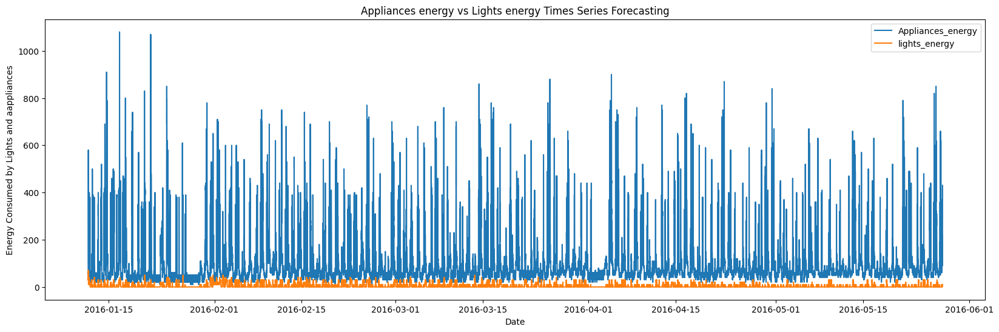

In [ ]:
plt.figure(figsize=(20,6))
sns.lineplot(y=df['Appliances_energy'],x = df['date'],linewidth = 1.5 , label = 'Appliances_energy')
sns.lineplot(y=df['lights_energy'],x = df['date'],linewidth = 1.5 , label = 'lights_energy')
plt.xlabel ('Date')
plt.ylabel ('Energy Consumed by Lights and aappliances')
plt.title('Appliances energy vs Lights energy Times Series Forecasting')
plt.show()

In [ ]:
df[df['Appliances_energy'] < df['lights_energy']]

,date,Appliances_energy,lights_energy,T_kitchen,RH_kitchen,T_livingroom,RH_livingroom,T_laundryroom,RH_laundryroom,T_officeroom,RH_officeroom,T_bathroom,RH_bathroom,T_OutsideBuliding,RH_OutsideBuilding,T_ironingroom,RH_ironingroom,T_teenagerroom2,RH_teenagerroom2,T_parentsroom,RH_parentsroom,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2


Calculating Appliances energy by date wise and how many watts used

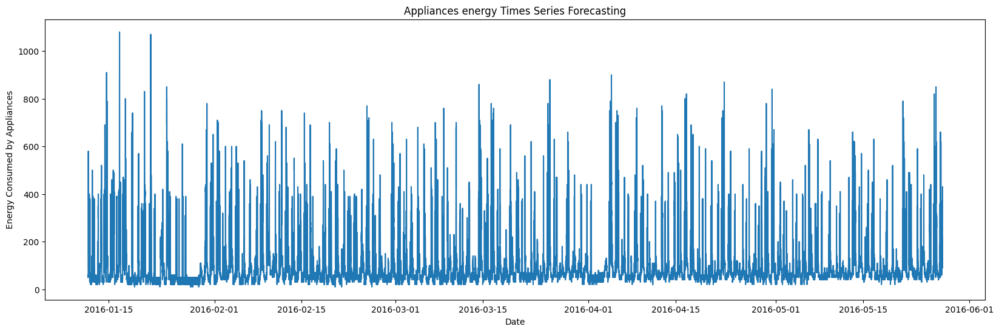

In [ ]:
plt.figure(figsize=(20,6))
sns.lineplot(y=df['Appliances_energy'],x = df['date'],linewidth = 1.5)
plt.xlabel ('Date')
plt.ylabel ('Energy Consumed by Appliances')
plt.title('Appliances energy Times Series Forecasting')
plt.show()

Calculating Light energy by date wise and how many watts used

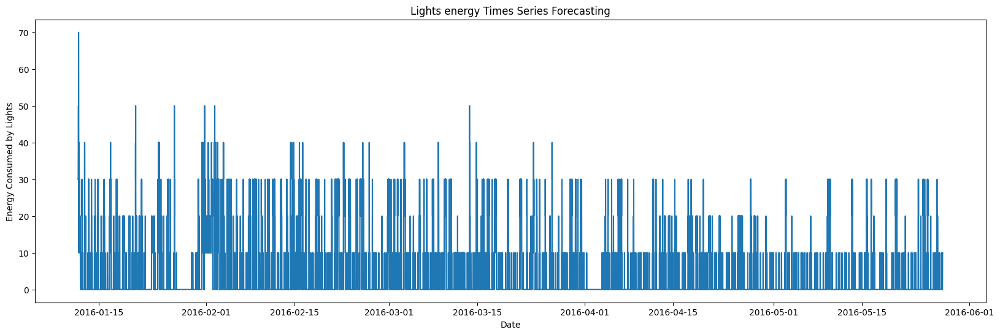

In [ ]:
plt.figure(figsize=(20,6))
sns.lineplot(y=df['lights_energy'],x = df['date'],linewidth = 1.5)
plt.xlabel ('Date')
plt.ylabel ('Energy Consumed by Lights')
plt.title('Lights energy Times Series Forecasting')
plt.show()

In [ ]:
df['lights_energy'].value_counts()

0     15252
10     2212
20     1624
30      559
40       77
50        9
70        1
60        1
Name: lights_energy, dtype: int64

In [ ]:
df[df['lights_energy'] == 0]['date']

51      2016-01-12 01:30:00
52      2016-01-12 01:40:00
53      2016-01-12 01:50:00
54      2016-01-12 02:00:00
55      2016-01-12 02:10:00
                ...        
19727   2016-05-27 16:50:00
19728   2016-05-27 17:00:00
19729   2016-05-27 17:10:00
19730   2016-05-27 17:20:00
19731   2016-05-27 17:30:00
Name: date, Length: 15252, dtype: datetime64[ns]

In [ ]:
df_lights_energy = df.groupby('lights_energy').agg({'Appliances_energy' : 'mean', 'T_kitchen':'mean', 'RH_kitchen':'mean',
                                                   'T_livingroom':'mean', 'RH_livingroom':'mean', 'T_laundryroom':'mean',
                                                    'RH_laundryroom':'mean','T_officeroom':'mean', 'RH_officeroom':'mean',
                                                    'T_bathroom':'mean', 'RH_bathroom':'mean','T_OutsideBuliding':'mean',
                                                    'RH_OutsideBuilding':'mean', 'T_ironingroom':'mean','RH_ironingroom':'mean',
                                                    'T_teenagerroom2':'mean', 'RH_teenagerroom2':'mean','T_parentsroom':'mean',
                                                    'RH_parentsroom':'mean', 'T_out':'mean', 'Press_mm_hg':'mean',
                                                    'RH_out':'mean','Windspeed':'mean', 'Visibility':'mean',
                                                   'Tdewpoint':'mean', 'rv1':'mean', 'rv2':'mean'})
df_lights_energy

,Appliances_energy,T_kitchen,RH_kitchen,T_livingroom,RH_livingroom,T_laundryroom,RH_laundryroom,T_officeroom,RH_officeroom,T_bathroom,RH_bathroom,T_OutsideBuliding,RH_OutsideBuilding,T_ironingroom,RH_ironingroom,T_teenagerroom2,RH_teenagerroom2,T_parentsroom,RH_parentsroom,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
lights_energy,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,86.584710,21.723160,40.050783,20.363159,40.340166,22.389374,39.044983,20.896750,38.794301,19.680537,50.343831,8.192855,52.108282,20.425384,35.324852,22.110047,42.938502,19.669194,41.597347,7.646922,755.518225,79.260580,3.961235,38.166151,3.875474,24.965617,24.965617
10,129.037071,21.379647,40.739160,20.091564,40.436926,21.739672,39.624906,20.332763,39.437247,19.182483,51.743821,6.915532,61.489342,19.735408,35.442281,21.652918,42.808597,18.821852,41.470343,6.552540,755.923386,80.790585,4.256247,39.202469,3.175979,25.220429,25.220429
20,136.428571,21.809905,40.955904,20.498642,40.772480,22.077684,39.908179,21.207834,39.923208,19.522776,53.946198,7.209585,62.095215,19.890462,35.551126,22.004075,42.794429,19.060631,41.032837,6.846420,755.099221,81.391435,4.296036,38.488711,3.603791,24.784330,24.784330
30,150.214669,21.650877,41.501385,20.329447,41.179115,21.773656,40.539395,20.957212,40.480007,19.224056,54.581169,6.495993,68.850499,19.447647,35.816658,21.663015,43.214274,18.666624,41.732034,6.290370,755.652803,82.874776,4.450507,38.473465,3.374389,25.551771,25.551771
40,182.337662,21.051775,43.693539,19.980135,42.667587,21.170985,43.368568,19.708766,43.235216,18.257466,57.924877,5.832224,87.500379,18.307530,39.211002,20.270395,46.708420,17.455363,44.280715,5.614502,753.795455,88.876623,4.757576,41.207792,3.846753,23.060086,23.060086
50,178.888889,20.885556,43.118889,20.145556,41.607778,20.560370,42.761481,19.405926,42.720741,17.751049,54.770586,7.420741,77.430370,18.985679,38.932531,20.500370,45.097222,17.475556,43.974074,7.216667,752.216667,83.407407,5.611111,40.851852,4.362963,27.523265,27.523265
60,580.000000,20.066667,46.396667,19.426667,44.400000,19.790000,44.826667,19.000000,46.430000,17.100000,55.000000,6.123333,87.993333,17.530000,44.263333,18.066667,48.633333,16.890000,45.290000,5.983333,734.433333,91.166667,5.833333,40.000000,4.616667,8.827838,8.827838
70,230.000000,19.926667,45.863333,19.356667,44.400000,19.790000,44.900000,18.890000,46.430000,17.100000,55.000000,6.190000,87.866667,17.247500,42.717500,18.100000,48.590000,17.000000,45.290000,5.966667,734.366667,91.333333,5.666667,40.000000,4.633333,10.298729,10.298729


In [ ]:
lights_energy_max = df.groupby('Appliances_energy').agg({'Appliances_energy' : 'max', 'T_kitchen':'max', 'RH_kitchen':'max',
                                                   'T_livingroom':'max', 'RH_livingroom':'max', 'T_laundryroom':'max',
                                                    'RH_laundryroom':'max','T_officeroom':'max', 'RH_officeroom':'max',
                                                    'T_bathroom':'max', 'RH_bathroom':'max','T_OutsideBuliding':'max',
                                                    'RH_OutsideBuilding':'max', 'T_ironingroom':'max','RH_ironingroom':'max',
                                                    'T_teenagerroom2':'max', 'RH_teenagerroom2':'max','T_parentsroom':'max',
                                                    'RH_parentsroom':'max', 'T_out':'max', 'Press_mm_hg':'max',
                                                    'RH_out':'max','Windspeed':'max', 'Visibility':'max',
                                                   'Tdewpoint':'max', 'rv1':'max', 'rv2':'max'})

Finding maximum energy consumption in Appliances

In [ ]:
lights_energy_max.style.highlight_max(color = 'cyan', axis = 0)

,Appliances_energy,T_kitchen,RH_kitchen,T_livingroom,RH_livingroom,T_laundryroom,RH_laundryroom,T_officeroom,RH_officeroom,T_bathroom,RH_bathroom,T_OutsideBuliding,RH_OutsideBuilding,T_ironingroom,RH_ironingroom,T_teenagerroom2,RH_teenagerroom2,T_parentsroom,RH_parentsroom,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
Appliances_energy,,,,,,,,,,,,,,,,,,,,,,,,,,,
10,10,20.700000,47.126667,19.390000,46.900000,21.600000,45.400000,20.290000,48.090000,18.790000,60.145000,10.500000,99.900000,19.200000,44.893889,20.600000,53.000000,18.290000,48.900000,10.600000,766.733333,99.833333,8.666667,64.000000,8.900000,49.120302,49.120302
20,20,23.700000,47.400000,25.066667,47.400000,24.700000,46.790000,23.566667,49.900000,22.000000,89.210000,19.200000,99.900000,23.171429,50.965000,24.390000,58.462778,22.600000,52.966667,17.400000,770.516667,100.000000,13.000000,65.000000,10.700000,49.771281,49.771281
30,30,24.100000,48.366667,26.000000,47.400000,25.033333,46.790000,24.200000,49.900000,23.500000,80.230000,21.360000,99.900000,23.890000,51.050000,24.790000,58.187778,23.000000,53.000000,17.333333,771.300000,100.000000,11.500000,65.000000,12.700000,49.972770,49.972770
40,40,25.600000,51.503364,28.890000,50.204444,27.126636,46.790000,25.642857,49.700000,24.500000,92.300000,27.921429,99.900000,25.290000,51.327778,26.585714,58.780000,24.200000,53.326667,25.766667,772.200000,100.000000,13.000000,66.000000,13.700000,49.993173,49.993173
50,50,25.600000,57.395000,29.856667,51.884685,27.288091,47.054000,26.100000,49.790000,24.500000,93.554000,28.290000,99.900000,25.290000,51.400000,26.890000,58.730000,24.290000,53.223333,26.033333,772.233333,100.000000,13.000000,66.000000,15.500000,49.996530,49.996530
60,60,25.730000,54.800000,29.790000,51.989700,28.566667,47.160000,26.100000,50.090000,24.550000,95.608889,28.236000,99.900000,25.290000,51.151111,27.014286,58.615556,24.390000,53.163333,25.966667,771.950000,100.000000,13.000000,65.000000,15.400000,49.991011,49.991011
70,70,25.633333,53.660000,29.200000,51.569640,28.790000,48.447500,26.142857,50.030000,24.456000,96.321667,27.738571,99.900000,25.390000,50.289444,27.230000,55.630000,24.365000,52.500000,26.100000,772.250000,100.000000,13.000000,66.000000,14.300000,49.829665,49.829665
80,80,25.790000,53.530727,29.500000,53.249880,28.426667,48.193333,26.200000,50.030000,25.096667,95.953889,27.614286,99.900000,25.390000,48.529444,27.230000,55.578333,24.290000,52.030000,25.150000,771.866667,100.000000,13.000000,65.000000,14.800000,49.981674,49.981674
90,90,25.700000,53.460818,28.361429,53.144865,28.760000,49.656667,26.100000,50.656667,24.823333,94.913333,27.065714,99.900000,25.290000,50.381667,26.700000,54.484545,24.290000,51.218000,25.350000,770.700000,100.000000,14.000000,64.833333,14.866667,49.864682,49.864682


In [ ]:
appliance_energy_min = df.groupby('Appliances_energy').agg({'Appliances_energy' : 'min', 'T_kitchen':'min', 'RH_kitchen':'min',
                                                   'T_livingroom':'min', 'RH_livingroom':'min', 'T_laundryroom':'min',
                                                    'RH_laundryroom':'min','T_officeroom':'min', 'RH_officeroom':'min',
                                                    'T_bathroom':'min', 'RH_bathroom':'min','T_OutsideBuliding':'min',
                                                    'RH_OutsideBuilding':'min', 'T_ironingroom':'min','RH_ironingroom':'min',
                                                    'T_teenagerroom2':'min', 'RH_teenagerroom2':'min','T_parentsroom':'min',
                                                    'RH_parentsroom':'min', 'T_out':'min', 'Press_mm_hg':'min',
                                                    'RH_out':'min','Windspeed':'min', 'Visibility':'min',
                                                   'Tdewpoint':'min', 'rv1':'min', 'rv2':'min'})

Finding minimum energy consumption in Appliances

In [ ]:
appliance_energy_min.style.highlight_min(color = 'magenta', axis = 0)


,Appliances_energy,T_kitchen,RH_kitchen,T_livingroom,RH_livingroom,T_laundryroom,RH_laundryroom,T_officeroom,RH_officeroom,T_bathroom,RH_bathroom,T_OutsideBuliding,RH_OutsideBuilding,T_ironingroom,RH_ironingroom,T_teenagerroom2,RH_teenagerroom2,T_parentsroom,RH_parentsroom,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
Appliances_energy,,,,,,,,,,,,,,,,,,,,,,,,,,,
10,10,17.290000,38.933333,16.290000,39.500000,17.700000,38.400000,15.300000,36.290000,15.555556,42.790000,-4.905556,83.466667,15.690000,33.900000,16.644444,43.590000,15.190000,41.290000,-4.100000,754.150000,74.000000,1.000000,14.000000,-5.700000,2.874300,2.874300
20,20,17.200000,28.996667,16.290000,24.063333,17.600000,32.060000,15.300000,29.430000,15.390000,39.881667,-5.752857,1.000000,15.566667,25.875714,16.583333,34.060000,15.100000,34.500000,-4.922222,738.783333,30.000000,0.166667,2.000000,-6.400000,0.471857,0.471857
30,30,17.390000,27.960000,16.200000,22.463333,17.700000,32.193333,15.390000,29.033333,15.375000,39.090000,-5.861905,1.000000,15.588889,25.700000,16.735000,33.433333,15.190000,33.290000,-4.933333,732.000000,31.333333,0.333333,1.666667,-6.400000,0.242009,0.242009
40,40,16.856667,28.730000,16.100000,23.456667,17.390000,32.000000,15.190000,29.290000,15.335000,30.033333,-6.028333,1.000000,15.544444,24.530000,16.555556,31.000000,15.000000,30.900000,-5.000000,732.066667,24.500000,0.000000,1.000000,-6.466667,0.068174,0.068174
50,50,16.790000,27.860000,16.100000,24.566667,17.390000,31.856667,15.130000,30.390000,15.360000,29.856667,-6.065000,1.000000,15.500000,23.426667,16.600000,29.675000,15.000000,29.926667,-4.977778,732.900000,25.000000,0.000000,1.000000,-6.550000,0.013539,0.013539
60,60,16.790000,28.893333,16.100000,24.733333,17.260000,31.823333,15.100000,29.096000,15.360000,29.815000,-5.712000,1.000000,15.500000,23.290000,16.890000,29.600000,15.000000,31.033333,-4.900000,730.966667,24.000000,0.000000,1.000000,-6.600000,0.014897,0.014897
70,70,16.790000,27.023333,16.100000,22.230000,17.200000,30.896667,15.100000,28.135714,15.345000,33.100000,-5.660000,1.000000,15.396111,23.463333,16.890000,29.823333,15.000000,29.290000,-4.750000,731.400000,28.000000,1.000000,1.000000,-6.483333,0.005322,0.005322
80,80,16.790000,27.233333,16.100000,21.760000,17.290000,30.663333,15.100000,27.660000,15.370000,35.560000,-5.427778,1.000000,15.420556,23.390000,17.397222,29.890000,14.890000,29.760000,-4.550000,730.933333,26.166667,1.000000,1.000000,-6.416667,0.031248,0.031248
90,90,16.890000,28.463333,16.100000,20.463333,17.290000,29.293333,15.100000,28.893333,15.330000,33.323333,-3.560000,1.000000,15.390000,23.500000,17.700000,30.133333,14.890000,29.200000,-2.550000,730.900000,26.000000,1.000000,4.500000,-5.266667,0.068588,0.068588


In [ ]:
lights_energy_max = df.groupby('lights_energy').agg({'Appliances_energy' : 'max', 'T_kitchen':'max', 'RH_kitchen':'max',
                                                   'T_livingroom':'max', 'RH_livingroom':'max', 'T_laundryroom':'max',
                                                    'RH_laundryroom':'max','T_officeroom':'max', 'RH_officeroom':'max',
                                                    'T_bathroom':'max', 'RH_bathroom':'max','T_OutsideBuliding':'max',
                                                    'RH_OutsideBuilding':'max', 'T_ironingroom':'max','RH_ironingroom':'max',
                                                    'T_teenagerroom2':'max', 'RH_teenagerroom2':'max','T_parentsroom':'max',
                                                    'RH_parentsroom':'max', 'T_out':'max', 'Press_mm_hg':'max',
                                                    'RH_out':'max','Windspeed':'max', 'Visibility':'max',
                                                   'Tdewpoint':'max', 'rv1':'max', 'rv2':'max'})

Finding maximum energy consumption in lights

In [ ]:
lights_energy_max.style.highlight_max(color = 'cyan', axis = 0)

,Appliances_energy,T_kitchen,RH_kitchen,T_livingroom,RH_livingroom,T_laundryroom,RH_laundryroom,T_officeroom,RH_officeroom,T_bathroom,RH_bathroom,T_OutsideBuliding,RH_OutsideBuilding,T_ironingroom,RH_ironingroom,T_teenagerroom2,RH_teenagerroom2,T_parentsroom,RH_parentsroom,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
lights_energy,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,910,26.260000,59.633333,29.856667,56.026667,29.236000,48.793333,26.200000,50.760000,25.795000,96.321667,28.290000,99.900000,26.000000,48.290000,27.230000,56.851111,24.500000,52.700000,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530
10,880,26.200000,63.360000,27.760000,52.463333,28.628571,49.800000,26.000000,50.930000,25.323333,94.913889,27.552857,99.900000,25.600000,51.400000,27.100000,58.780000,24.434000,53.326667,24.016667,772.283333,100.000000,13.000000,66.000000,15.050000,49.943874,49.943874
20,890,25.600000,53.545000,29.200000,49.033333,28.260000,50.163333,25.963333,51.090000,24.100000,93.622778,27.738571,99.900000,24.890000,51.141111,25.890000,58.730000,24.290000,53.326667,23.583333,771.300000,100.000000,13.000000,65.000000,14.100000,49.959734,49.959734
30,1080,25.600000,53.660000,29.260000,48.833333,27.934000,50.090000,26.000000,50.656667,24.066667,92.930556,27.578000,99.900000,24.790000,49.545000,25.890000,56.426667,24.290000,52.590000,23.700000,770.050000,99.000000,13.000000,65.000000,13.633333,49.839707,49.839707
40,620,24.033333,52.726667,23.100000,47.626667,24.200000,49.930000,21.500000,51.063333,21.853333,88.706667,13.417500,99.900000,22.823333,50.530000,25.000000,56.529444,19.890000,52.900000,13.433333,771.200000,99.000000,9.500000,62.666667,9.950000,49.138260,49.138260
50,430,22.390000,48.000000,21.890000,45.963333,22.323333,45.530000,21.260000,49.066667,19.600000,76.933889,10.520000,99.900000,23.033333,47.732778,25.033333,53.930556,19.390000,52.326667,10.933333,768.400000,94.000000,9.166667,62.000000,9.866667,47.233763,47.233763
60,580,20.066667,46.396667,19.426667,44.400000,19.790000,44.826667,19.000000,46.430000,17.100000,55.000000,6.123333,87.993333,17.530000,44.263333,18.066667,48.633333,16.890000,45.290000,5.983333,734.433333,91.166667,5.833333,40.000000,4.616667,8.827838,8.827838
70,230,19.926667,45.863333,19.356667,44.400000,19.790000,44.900000,18.890000,46.430000,17.100000,55.000000,6.190000,87.866667,17.247500,42.717500,18.100000,48.590000,17.000000,45.290000,5.966667,734.366667,91.333333,5.666667,40.000000,4.633333,10.298729,10.298729


In [ ]:
light_energy_min = df.groupby('lights_energy').agg({'Appliances_energy' : 'min', 'T_kitchen':'min', 'RH_kitchen':'min',
                                                   'T_livingroom':'min', 'RH_livingroom':'min', 'T_laundryroom':'min',
                                                    'RH_laundryroom':'min','T_officeroom':'min', 'RH_officeroom':'min',
                                                    'T_bathroom':'min', 'RH_bathroom':'min','T_OutsideBuliding':'min',
                                                    'RH_OutsideBuilding':'min', 'T_ironingroom':'min','RH_ironingroom':'min',
                                                    'T_teenagerroom2':'min', 'RH_teenagerroom2':'min','T_parentsroom':'min',
                                                    'RH_parentsroom':'min', 'T_out':'min', 'Press_mm_hg':'min',
                                                    'RH_out':'min','Windspeed':'min', 'Visibility':'min',
                                                   'Tdewpoint':'min', 'rv1':'min', 'rv2':'min'})

Finding minimum energy consumption in lights

In [ ]:
light_energy_min.style.highlight_min(color = 'magenta', axis = 0)


,Appliances_energy,T_kitchen,RH_kitchen,T_livingroom,RH_livingroom,T_laundryroom,RH_laundryroom,T_officeroom,RH_officeroom,T_bathroom,RH_bathroom,T_OutsideBuliding,RH_OutsideBuilding,T_ironingroom,RH_ironingroom,T_teenagerroom2,RH_teenagerroom2,T_parentsroom,RH_parentsroom,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
lights_energy,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,10,16.790000,27.233333,16.100000,20.463333,17.290000,28.766667,15.100000,28.424286,15.330000,29.815000,-6.065000,1.000000,15.390000,23.200000,16.583333,29.600000,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.500000,0.005322,0.005322
10,10,16.790000,27.023333,16.100000,20.833333,17.200000,30.823333,15.100000,28.135714,15.345000,33.323333,-5.872222,1.000000,15.390000,23.730000,16.306667,29.856667,14.890000,29.760000,-4.833333,730.933333,28.666667,0.000000,1.000000,-6.550000,0.028526,0.028526
20,30,16.790000,27.860000,16.100000,25.866667,17.200000,33.626667,15.100000,27.660000,15.345000,35.363333,-5.888889,1.000000,15.414444,23.230000,16.500000,30.360000,15.000000,31.356667,-4.900000,730.900000,31.166667,0.000000,2.166667,-6.600000,0.010019,0.010019
30,40,17.600000,31.926667,16.790000,32.296667,17.856667,33.626667,16.100000,32.156667,15.340000,37.030000,-5.433333,1.000000,15.600000,23.500000,17.890000,30.823333,15.390000,32.637143,-4.316667,730.916667,43.000000,0.500000,14.000000,-6.016667,0.045925,0.045925
40,50,18.230000,37.160000,17.600000,37.293333,18.400000,35.560000,16.100000,34.426667,15.414444,44.266667,-4.060000,27.023333,15.600000,24.390000,17.890000,30.693333,15.390000,35.290000,-3.300000,733.800000,64.000000,1.000000,20.666667,-4.200000,0.082113,0.082113
50,50,18.600000,33.723333,18.166667,32.996667,19.460000,35.500000,16.133333,32.626667,16.055556,43.590000,0.733333,23.123333,16.100000,25.926667,17.890000,31.096667,15.390000,35.790000,0.050000,734.100000,57.833333,1.166667,28.000000,-1.283333,1.463865,1.463865
60,580,20.066667,46.396667,19.426667,44.400000,19.790000,44.826667,19.000000,46.430000,17.100000,55.000000,6.123333,87.993333,17.530000,44.263333,18.066667,48.633333,16.890000,45.290000,5.983333,734.433333,91.166667,5.833333,40.000000,4.616667,8.827838,8.827838
70,230,19.926667,45.863333,19.356667,44.400000,19.790000,44.900000,18.890000,46.430000,17.100000,55.000000,6.190000,87.866667,17.247500,42.717500,18.100000,48.590000,17.000000,45.290000,5.966667,734.366667,91.333333,5.666667,40.000000,4.633333,10.298729,10.298729


<Figure size 1000x1000 with 0 Axes>

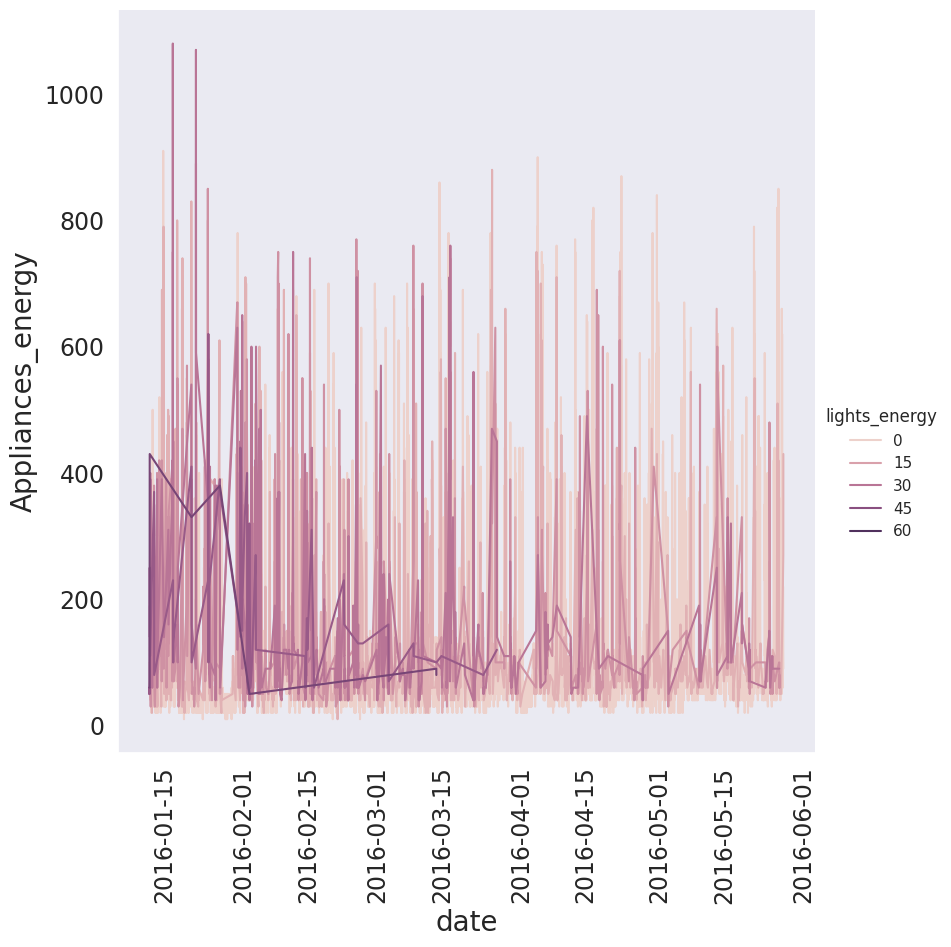

In [ ]:
# Combining lineplots using relplot
plt.figure(figsize=(10,10))
sns.set(rc={'xtick.labelsize':17,'ytick.labelsize':17,'axes.labelsize':20  , "axes.grid":False})
sns.relplot(x="date" , y="Appliances_energy" , hue="lights_energy",kind='line', height=8.5, aspect=1 ,data=df)
plt.xticks(rotation=90) # Rotating X tickts by 45 degrees
plt.show()

In [ ]:
#the room power are calculated in watts

First idendifiying the appliances eneergy in each separate rooms

---



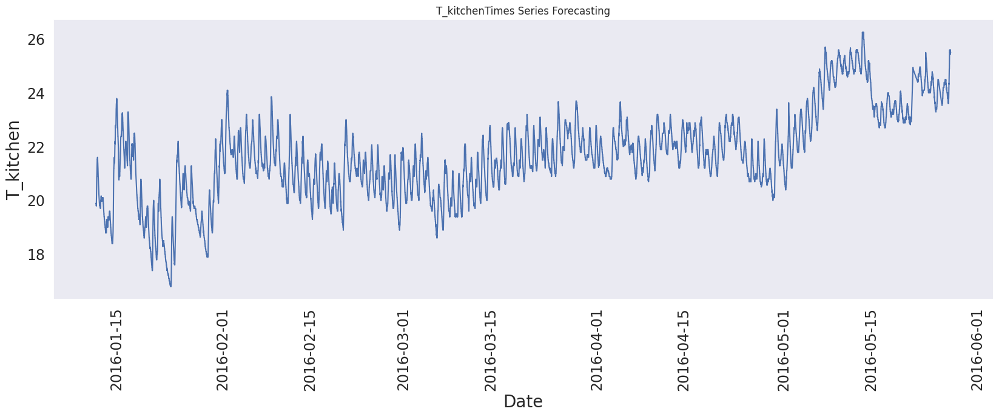

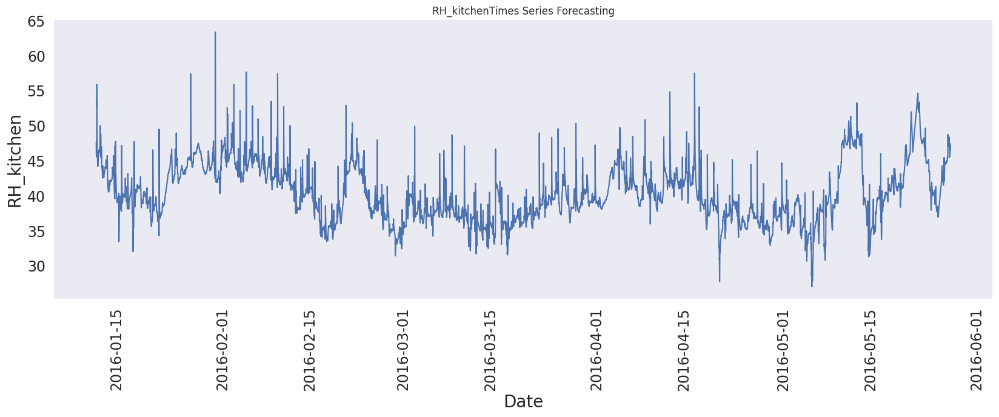

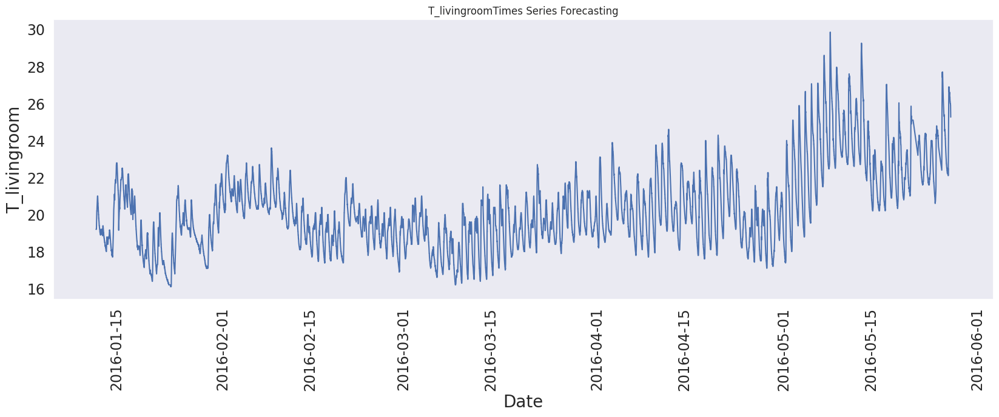

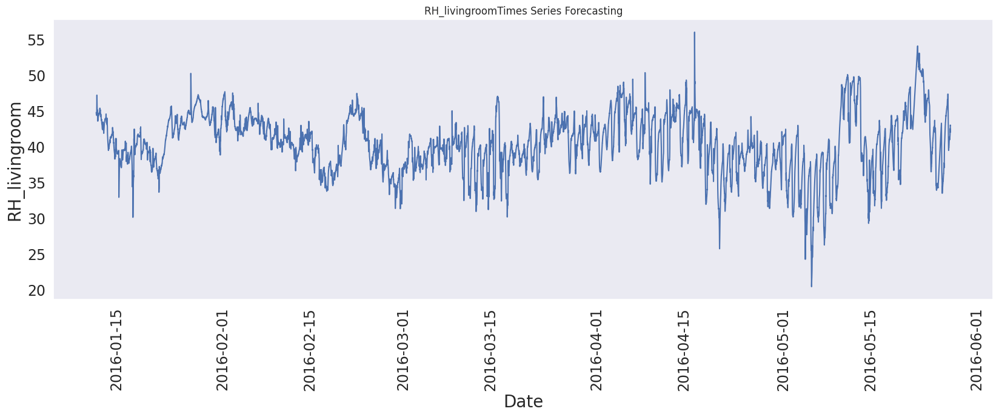

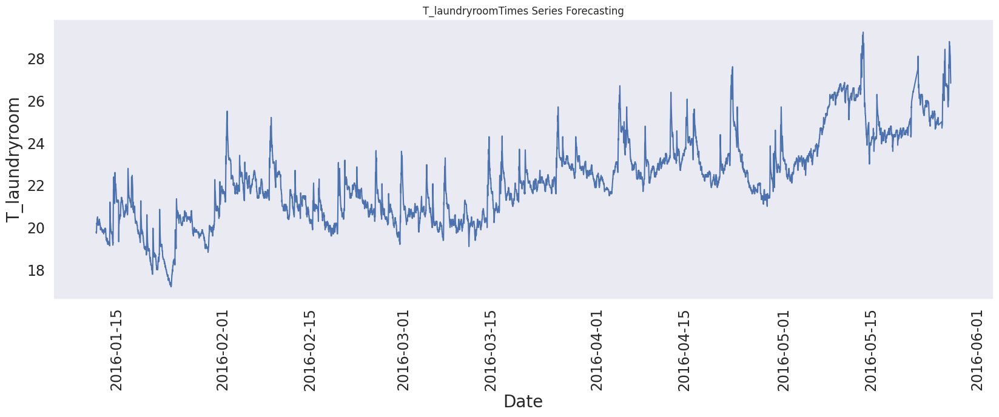

...

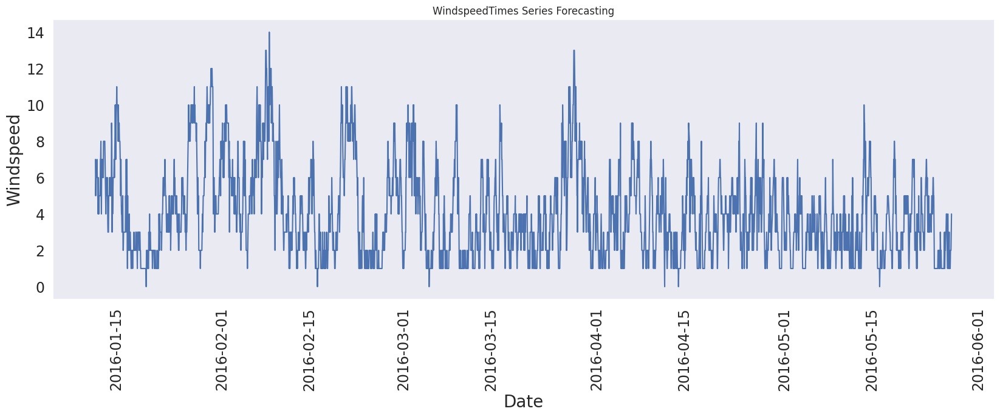

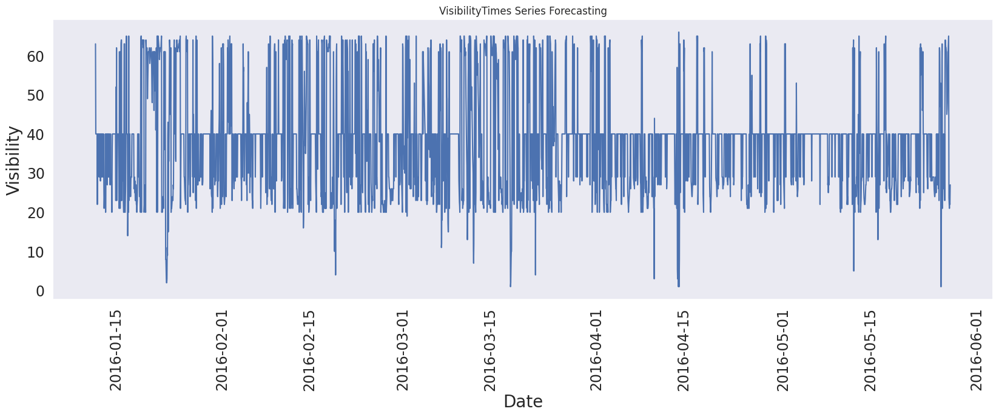

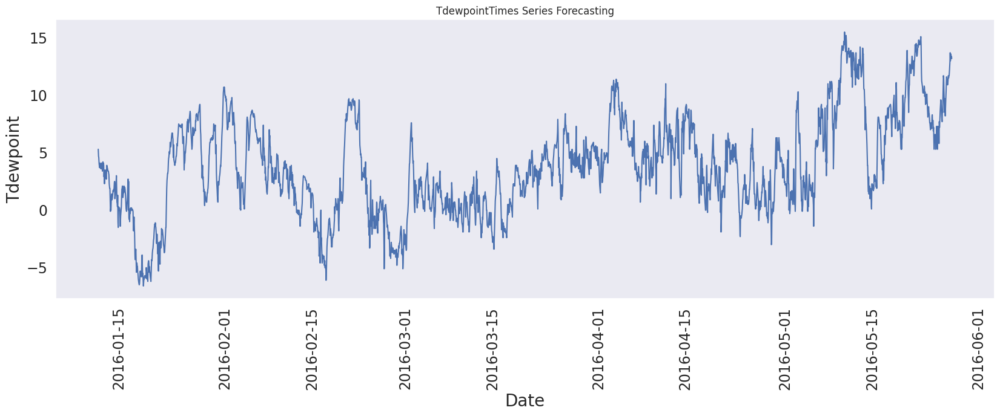

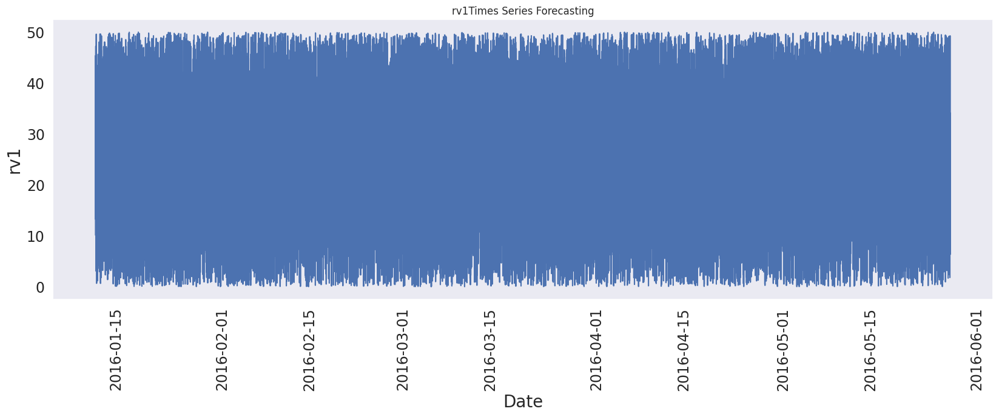

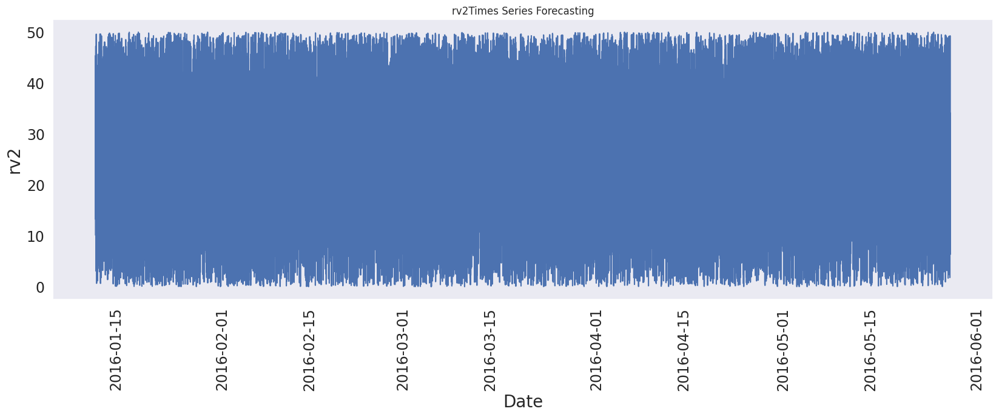

In [ ]:
for i in df.columns[3:]:
    plt.figure(figsize=(20,6))
    sns.lineplot(y=df[i],x = df['date'],linewidth = 1.5)
    plt.xlabel ('Date')
    plt.ylabel (i)
    plt.title('{}Times Series Forecasting'.format(i))
    plt.xticks(rotation=90)
    plt.show()

Then idendifiying the applightsliances energy in each separate rooms

<Figure size 1000x1000 with 0 Axes>

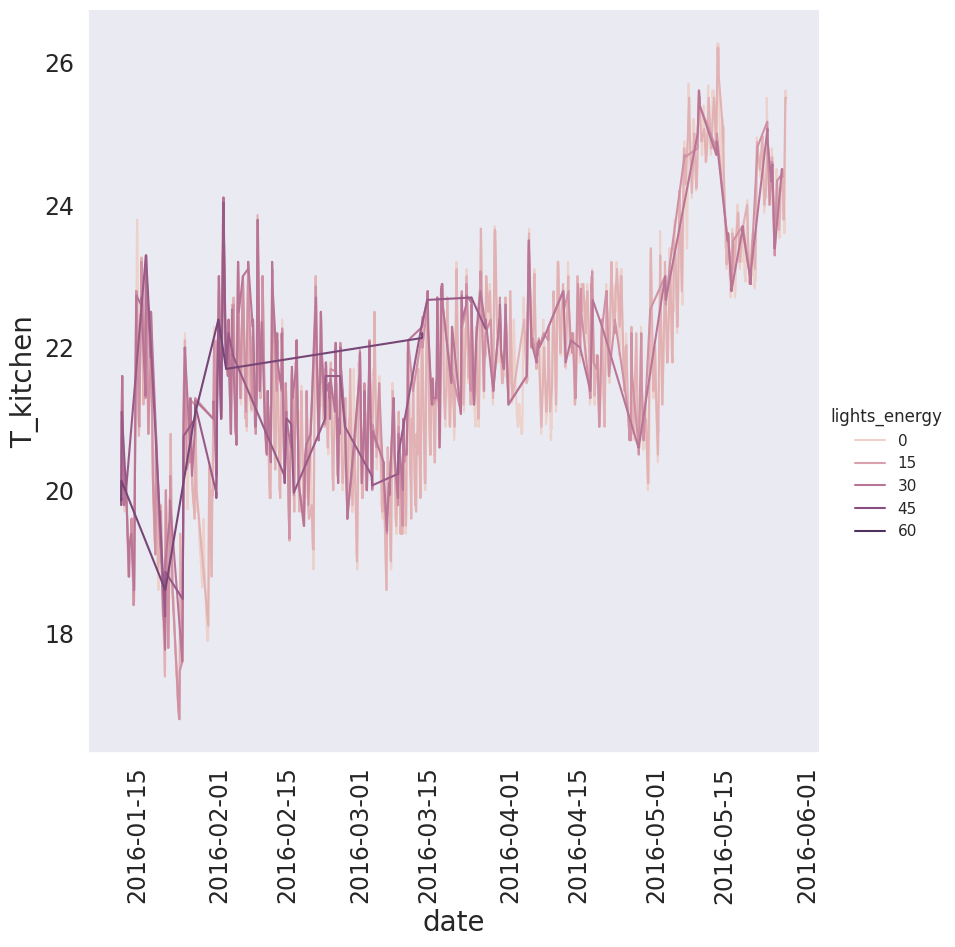

<Figure size 1000x1000 with 0 Axes>

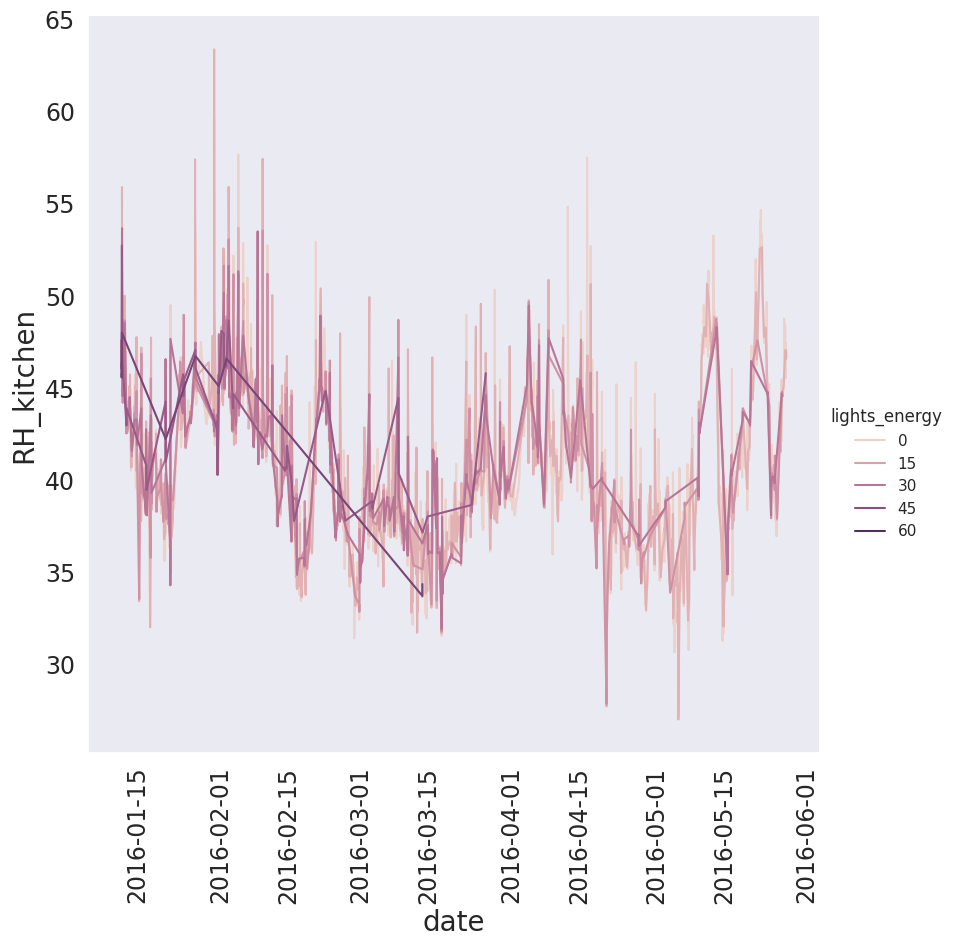

<Figure size 1000x1000 with 0 Axes>

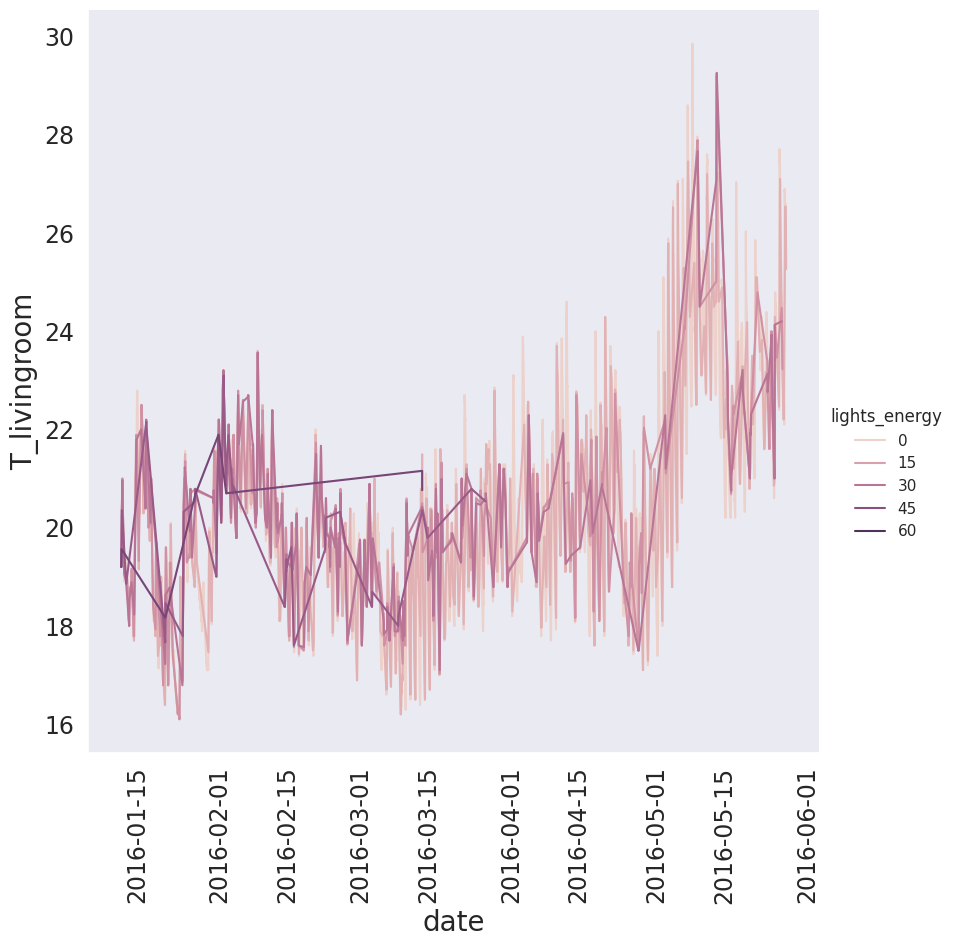

<Figure size 1000x1000 with 0 Axes>

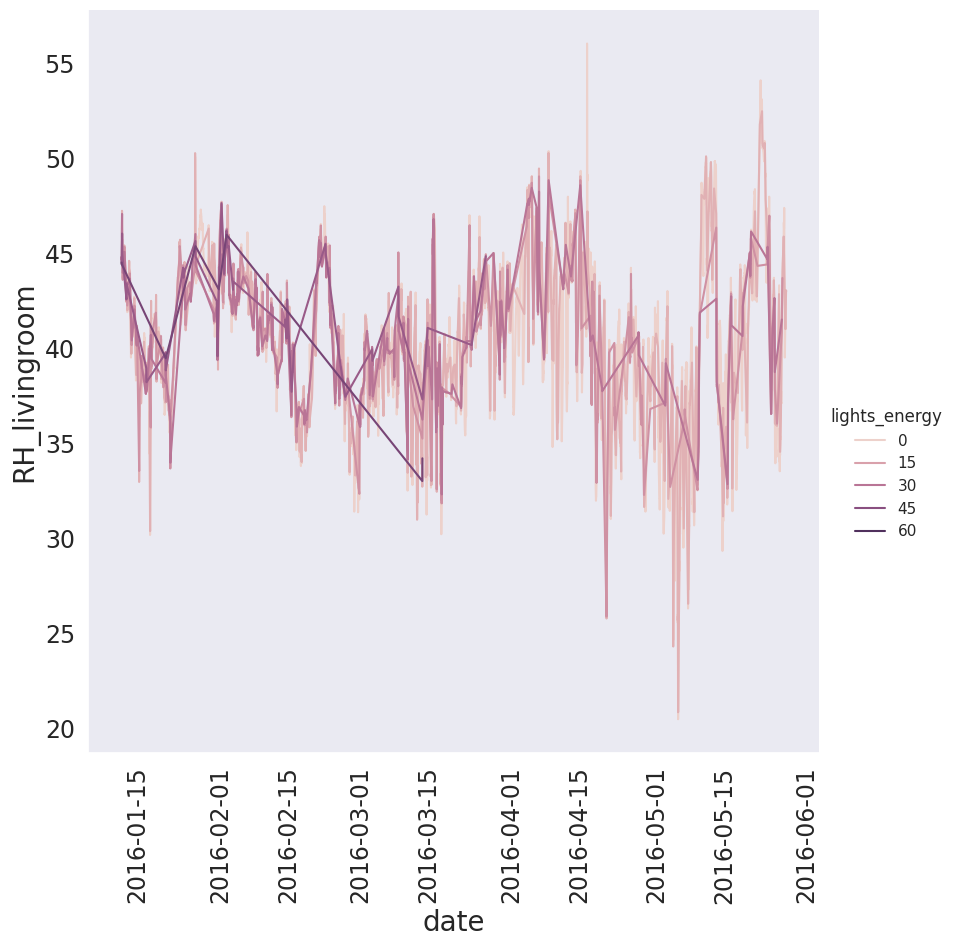

<Figure size 1000x1000 with 0 Axes>

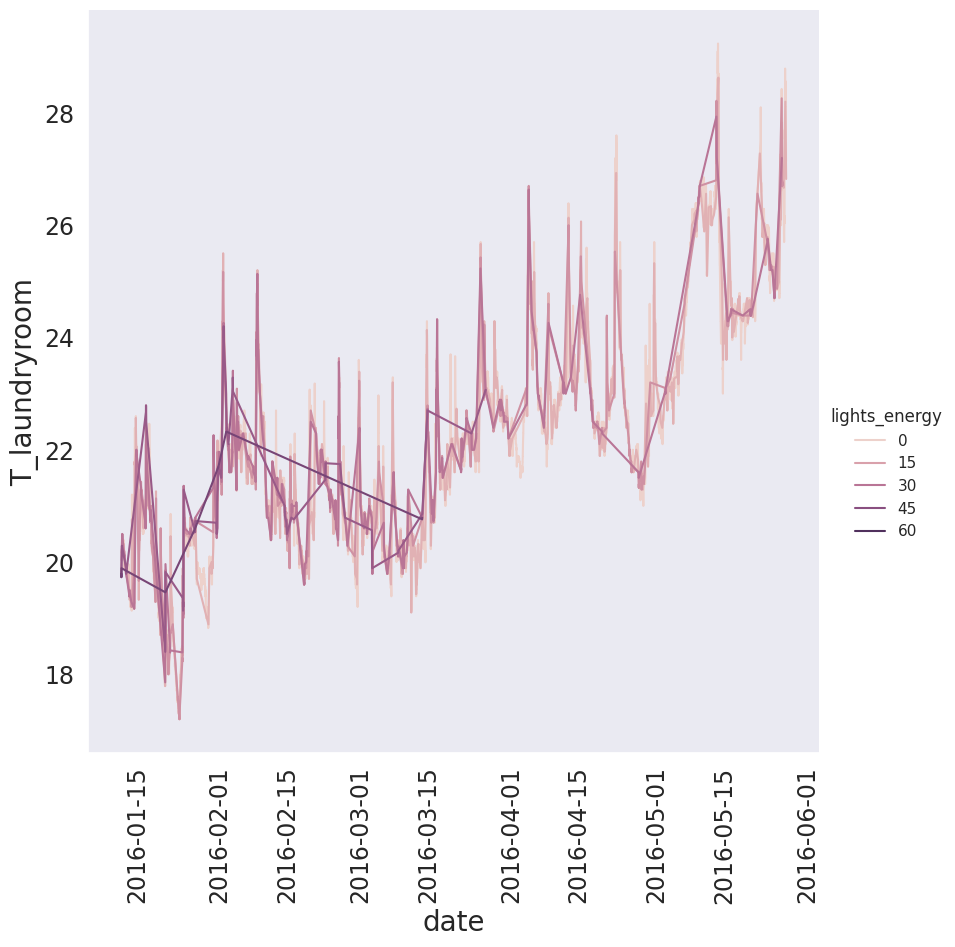

<Figure size 1000x1000 with 0 Axes>

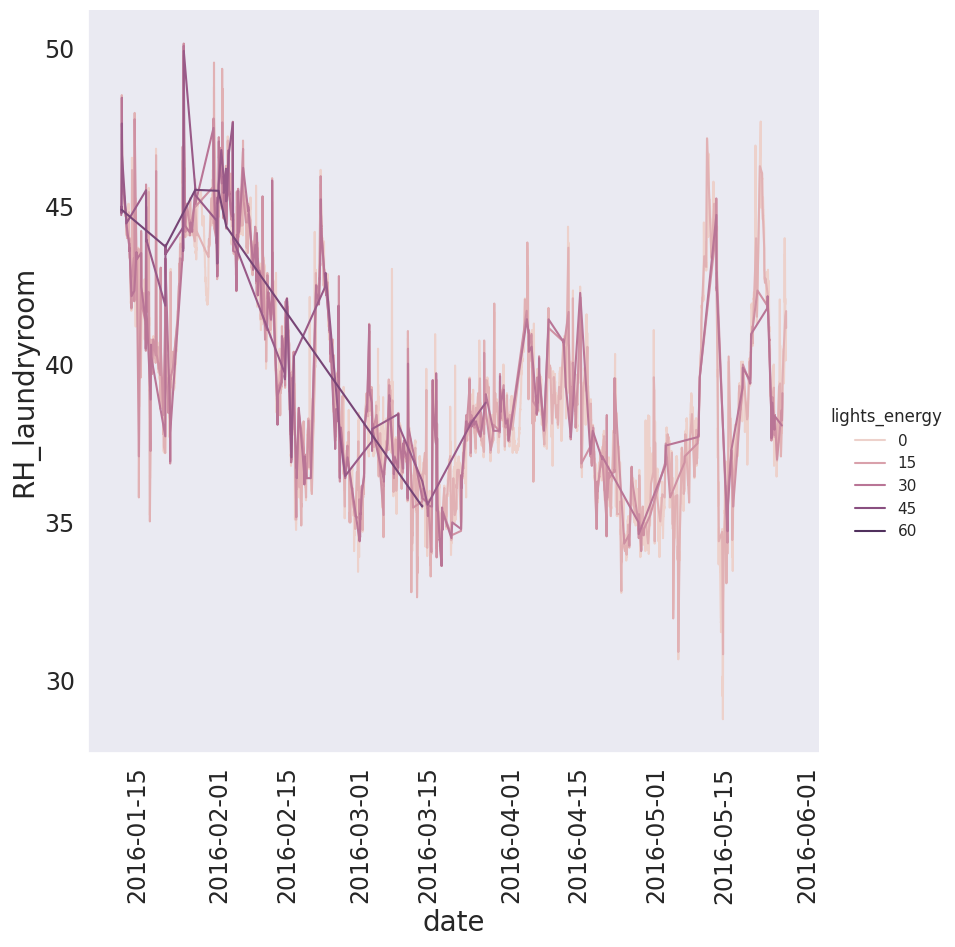

<Figure size 1000x1000 with 0 Axes>

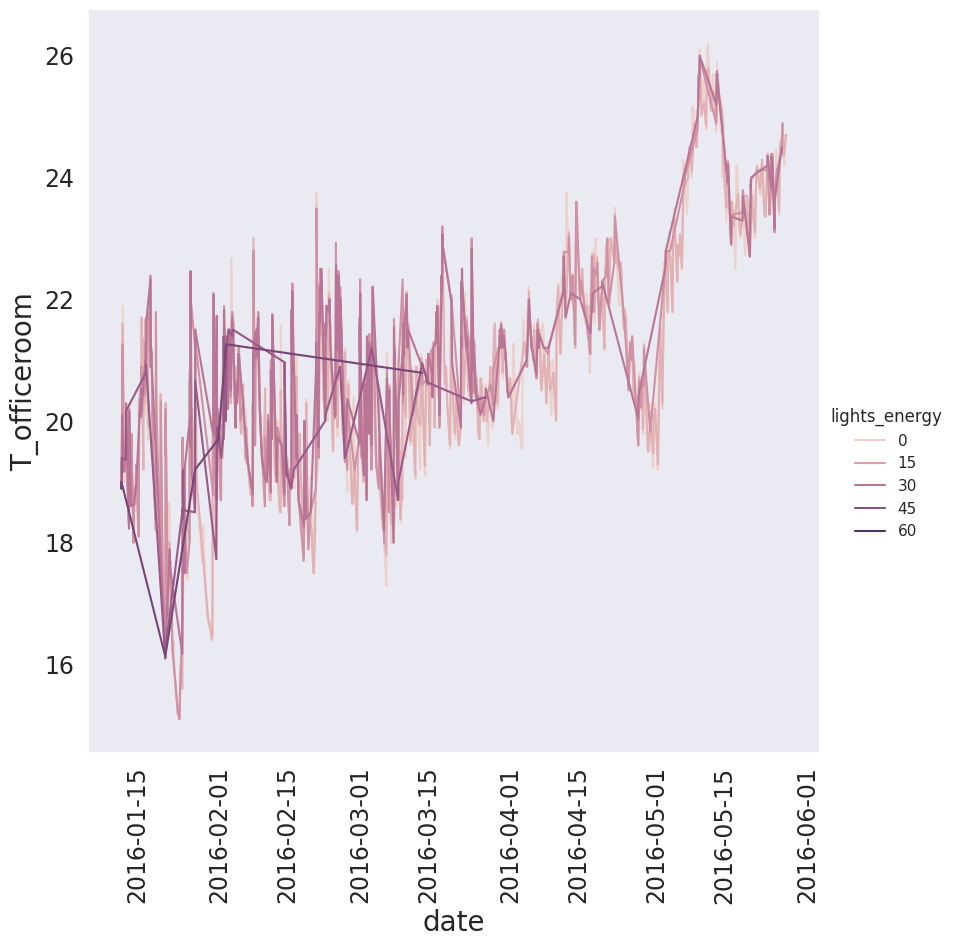

<Figure size 1000x1000 with 0 Axes>

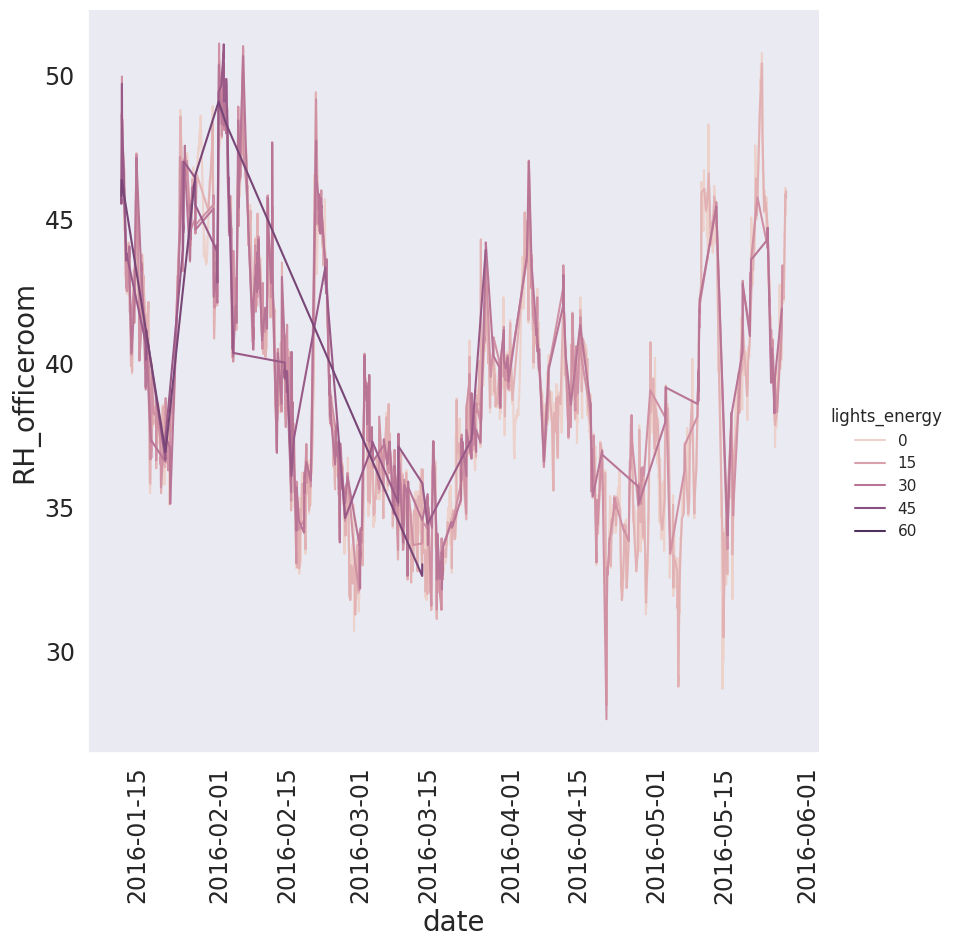

<Figure size 1000x1000 with 0 Axes>

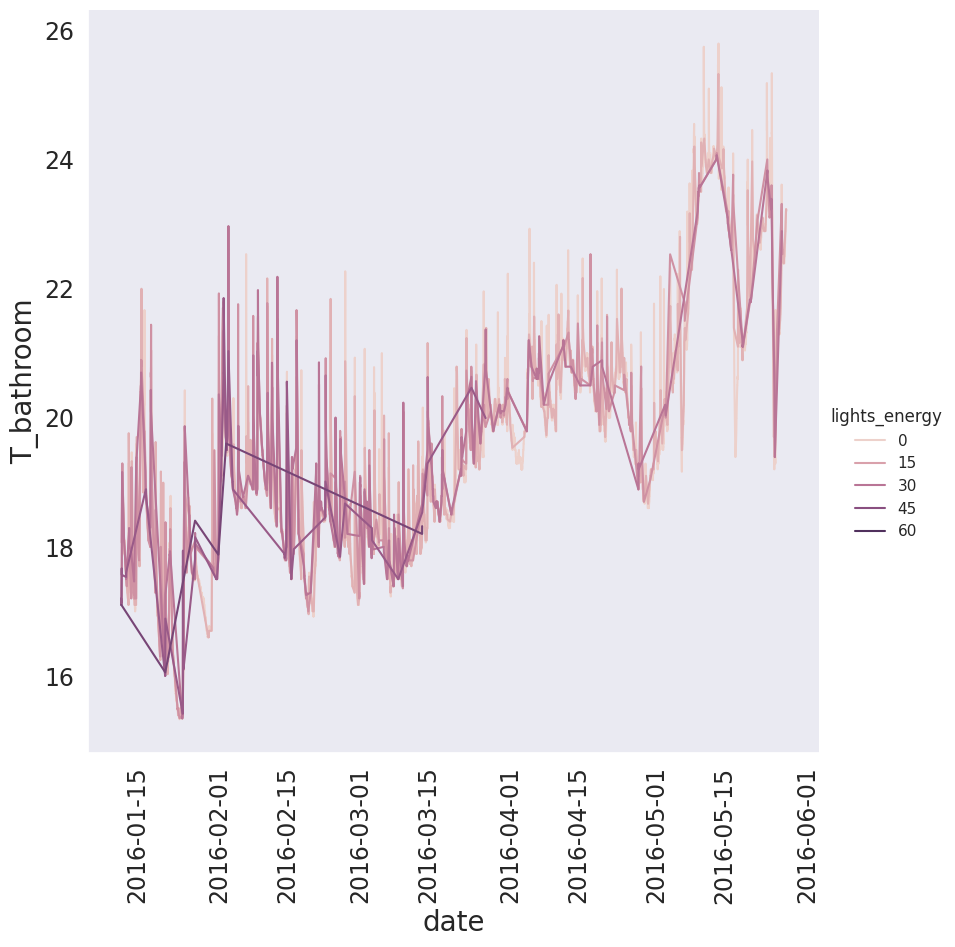

<Figure size 1000x1000 with 0 Axes>

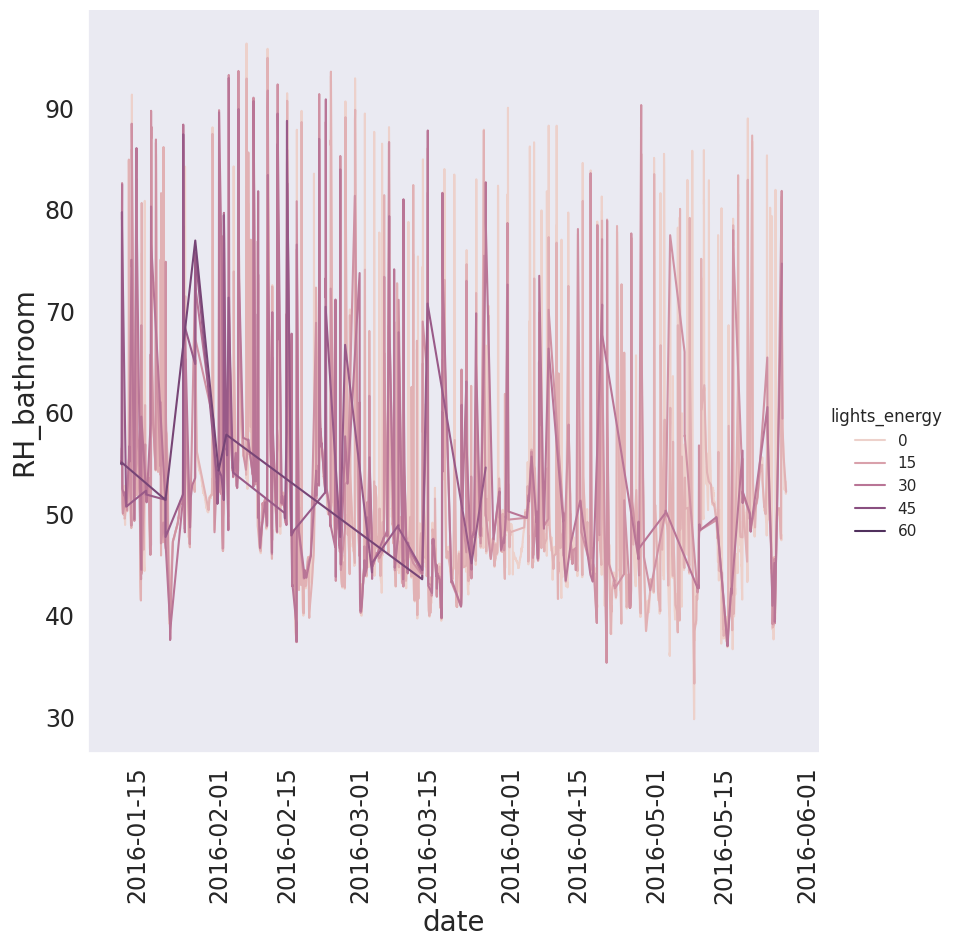

<Figure size 1000x1000 with 0 Axes>

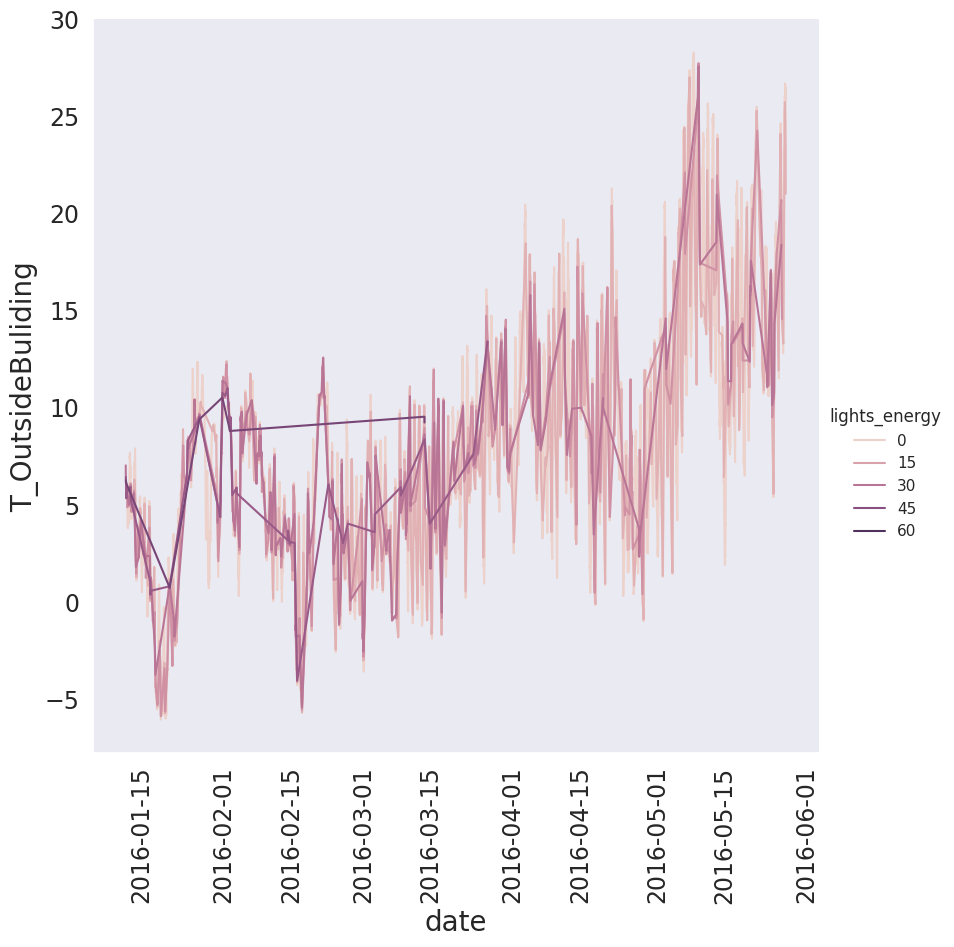

<Figure size 1000x1000 with 0 Axes>

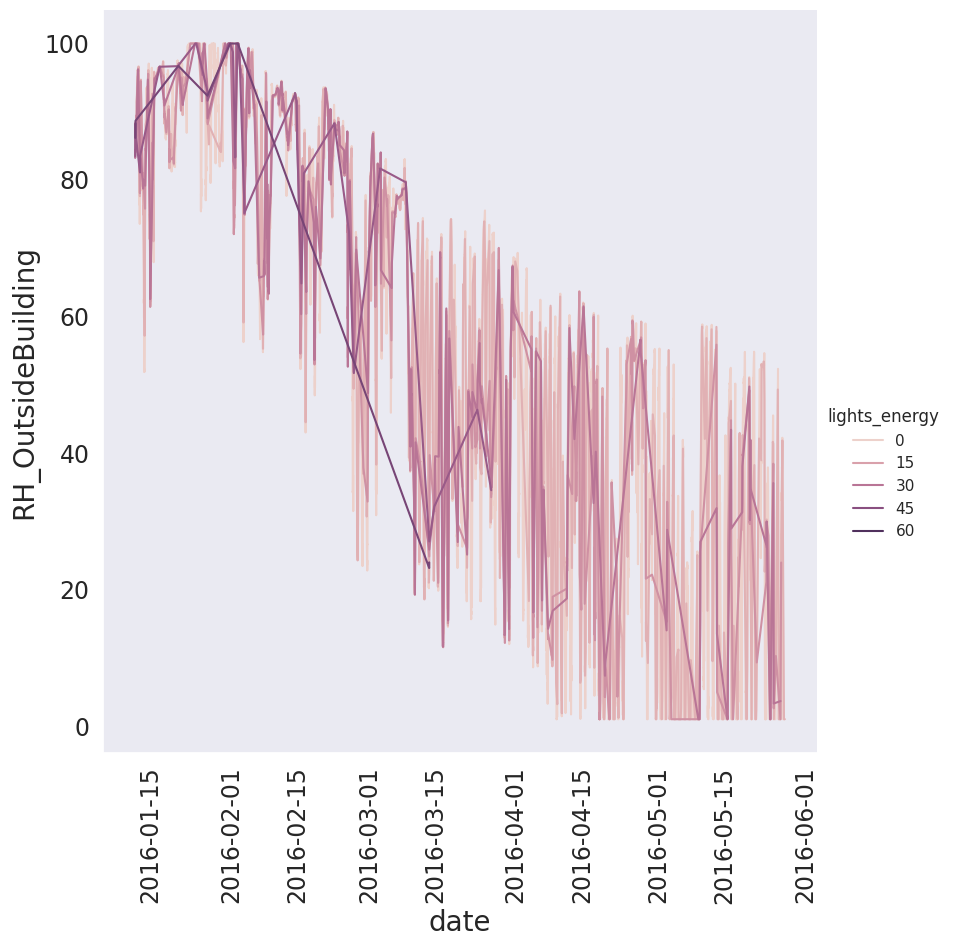

<Figure size 1000x1000 with 0 Axes>

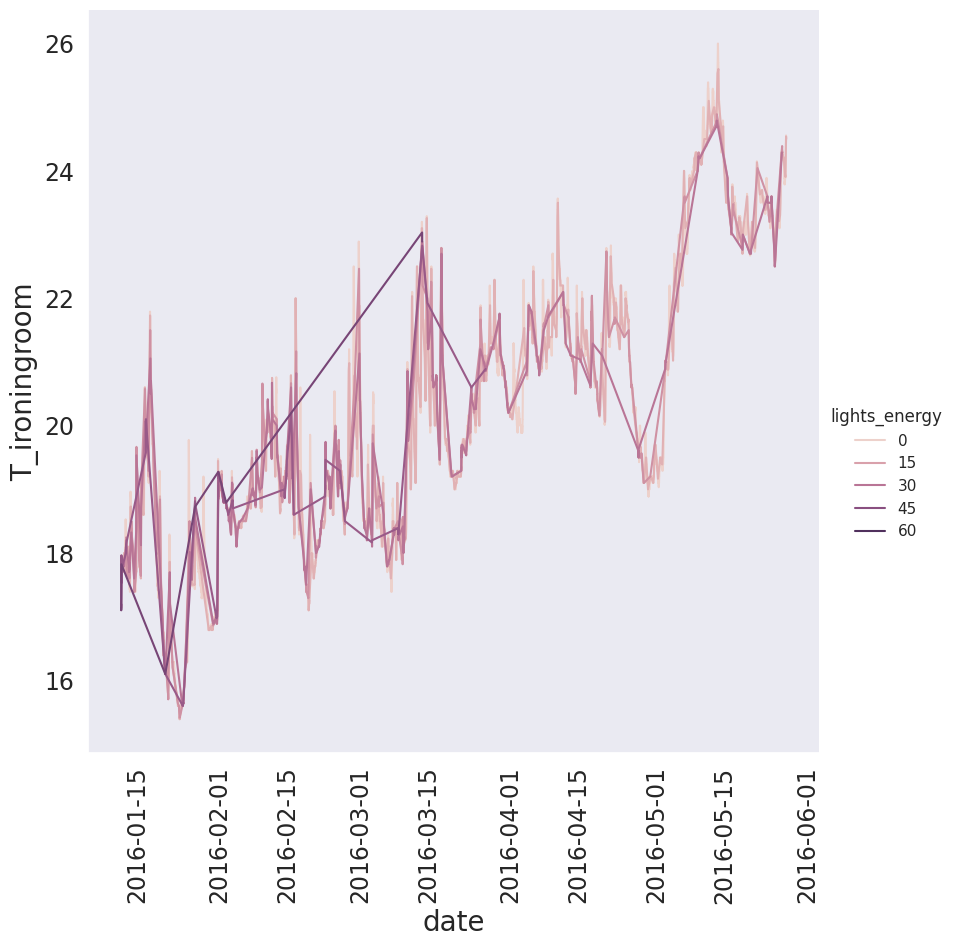

<Figure size 1000x1000 with 0 Axes>

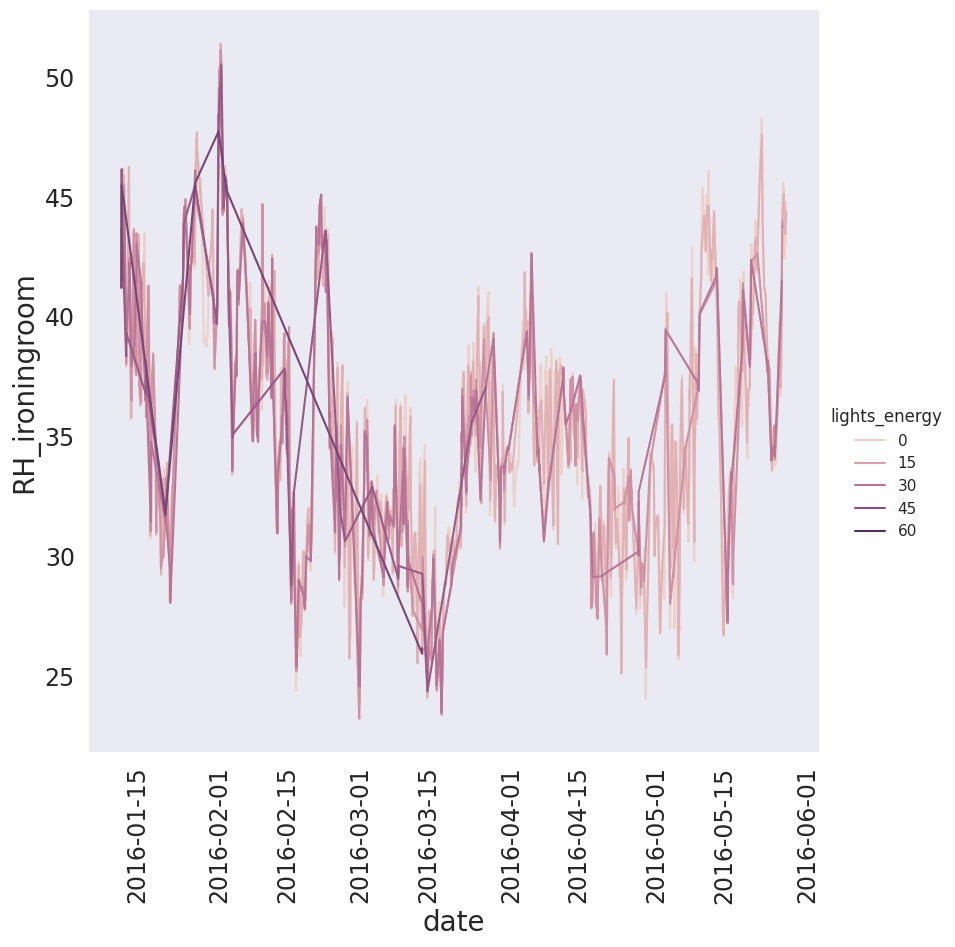

<Figure size 1000x1000 with 0 Axes>

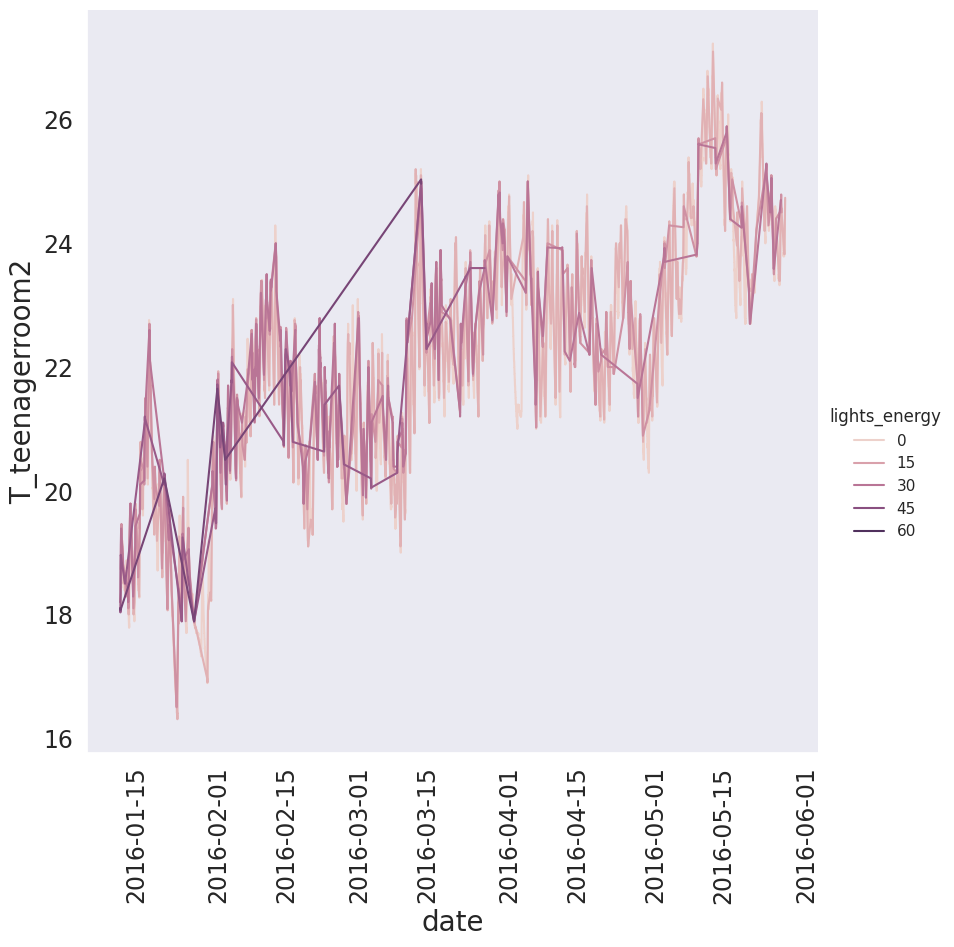

<Figure size 1000x1000 with 0 Axes>

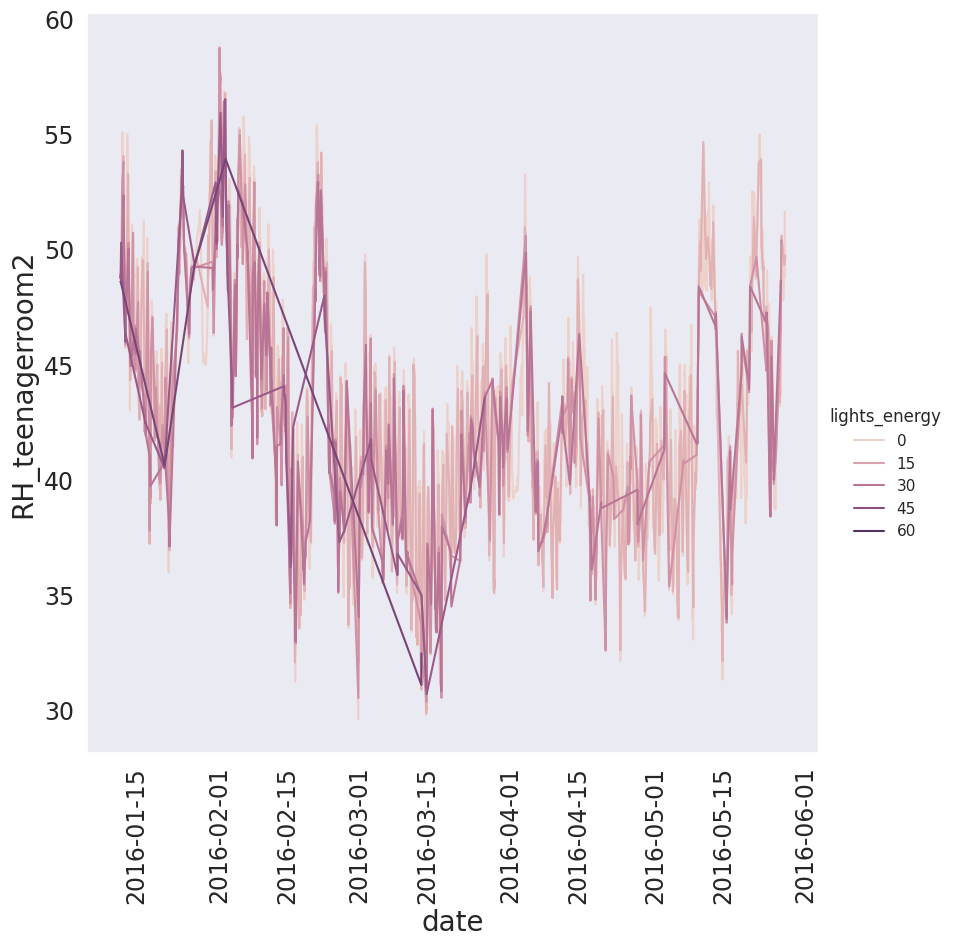

<Figure size 1000x1000 with 0 Axes>

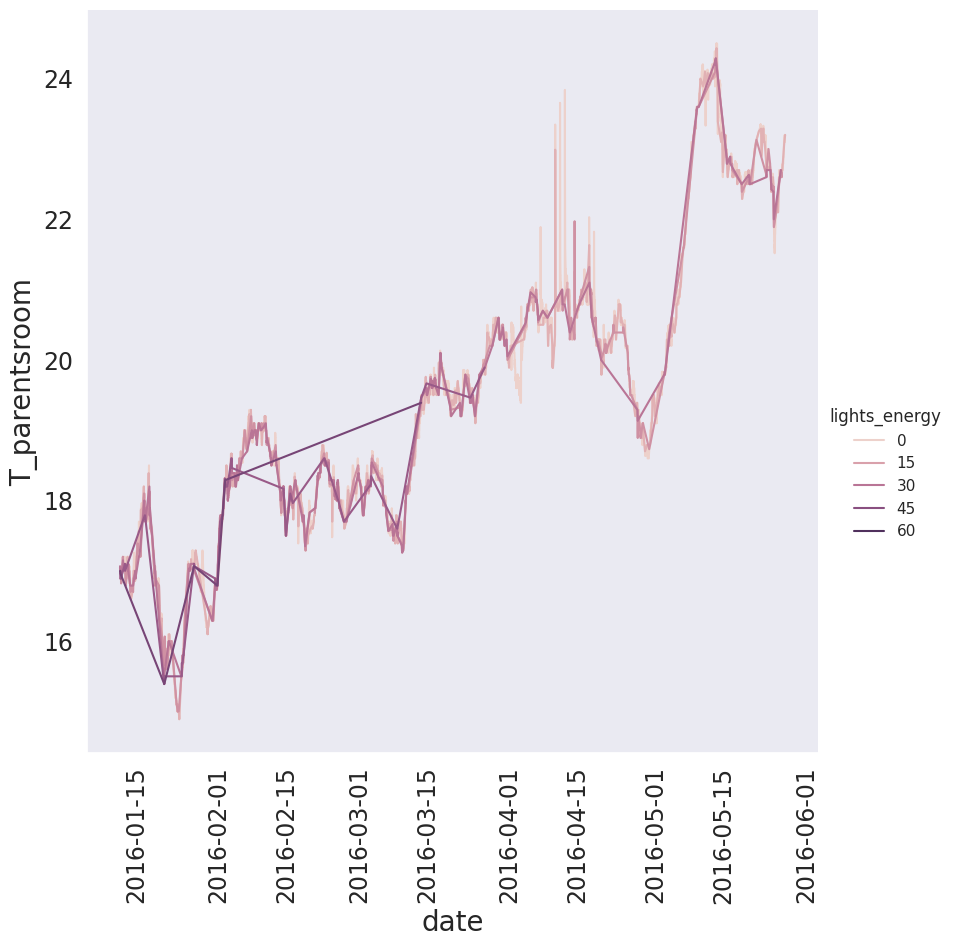

<Figure size 1000x1000 with 0 Axes>

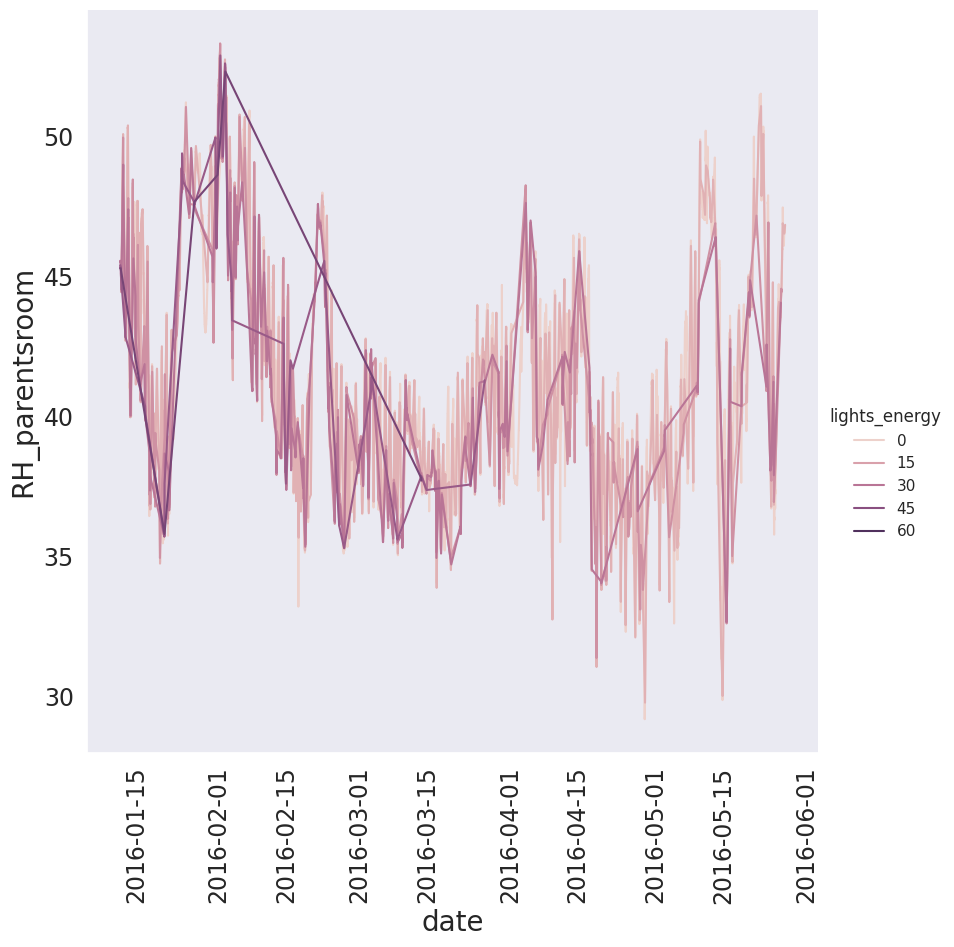

<Figure size 1000x1000 with 0 Axes>

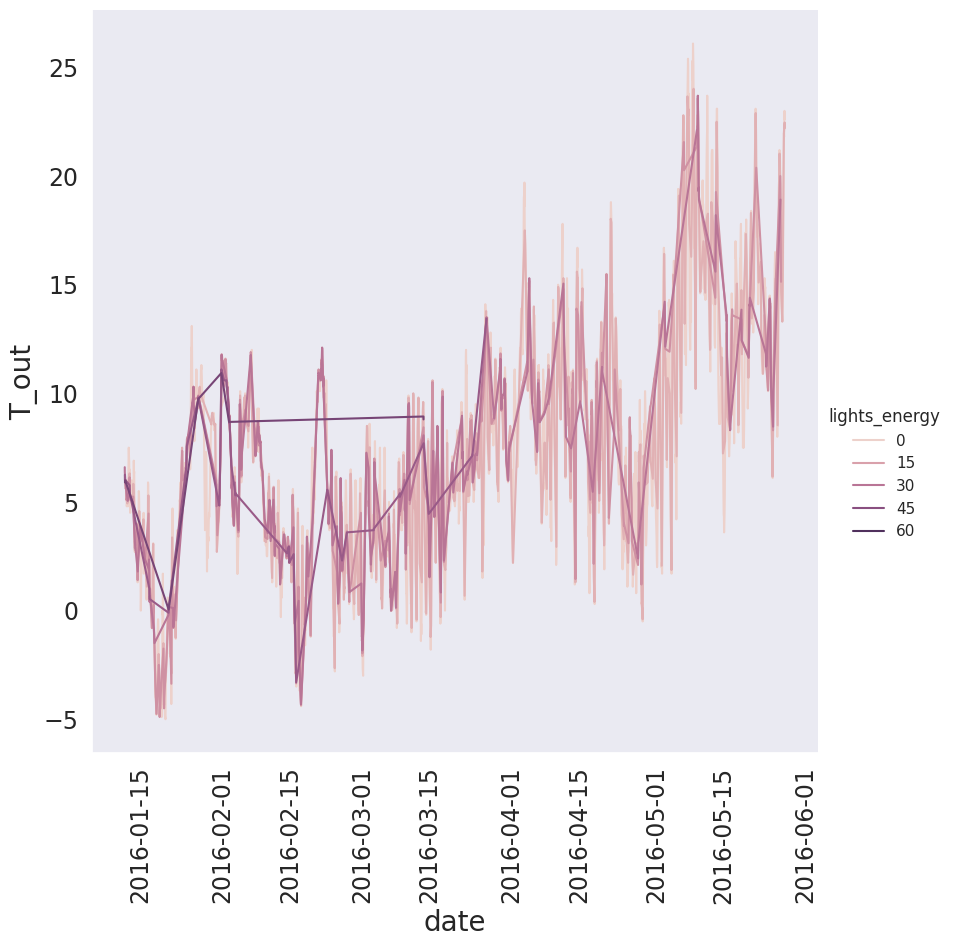

<Figure size 1000x1000 with 0 Axes>

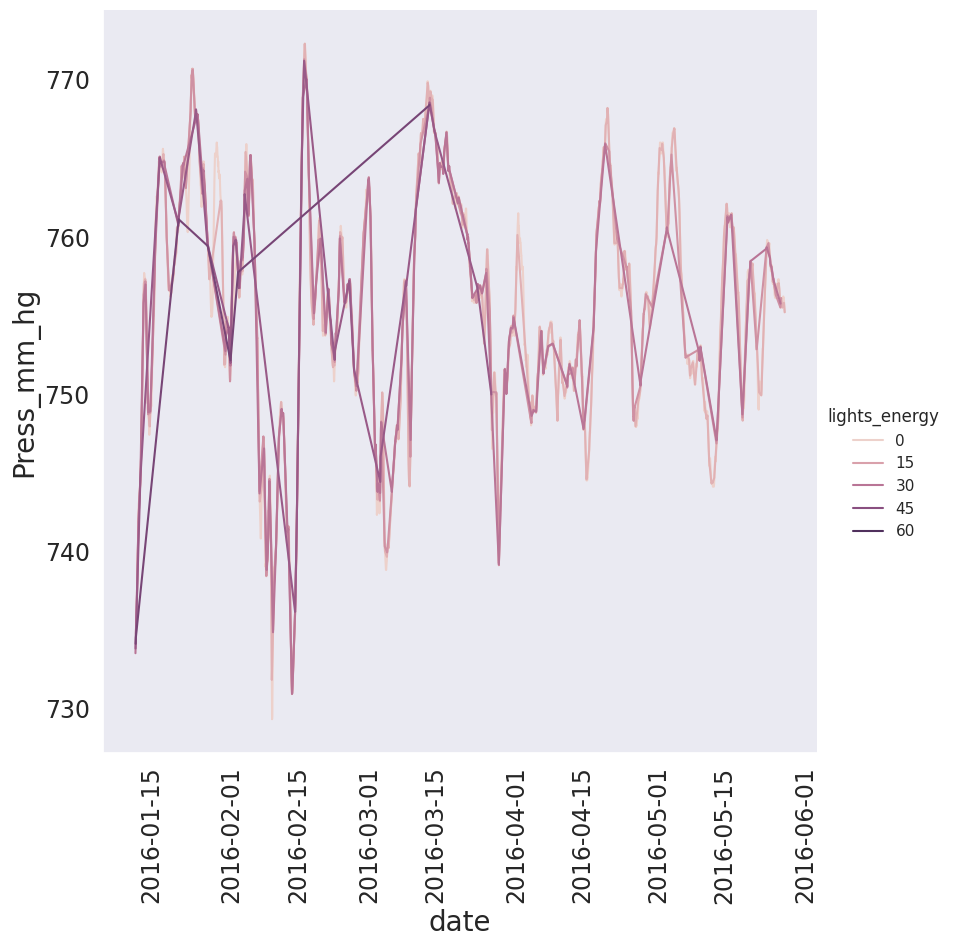

<Figure size 1000x1000 with 0 Axes>

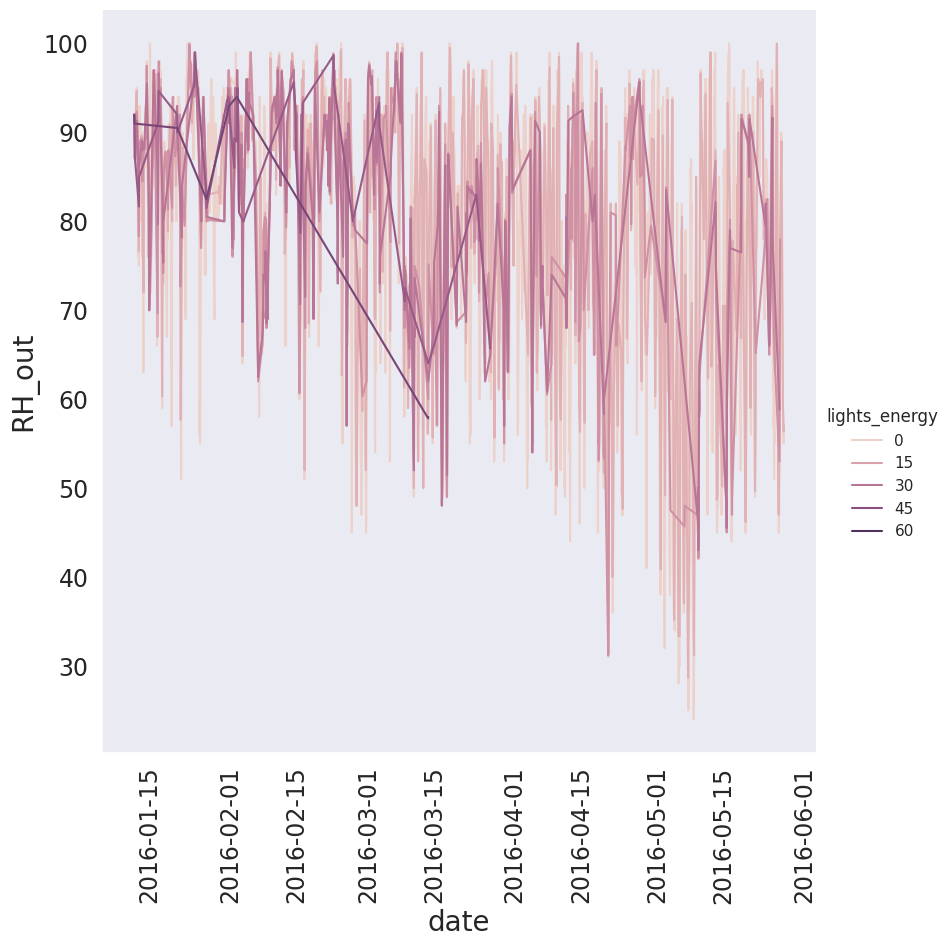

<Figure size 1000x1000 with 0 Axes>

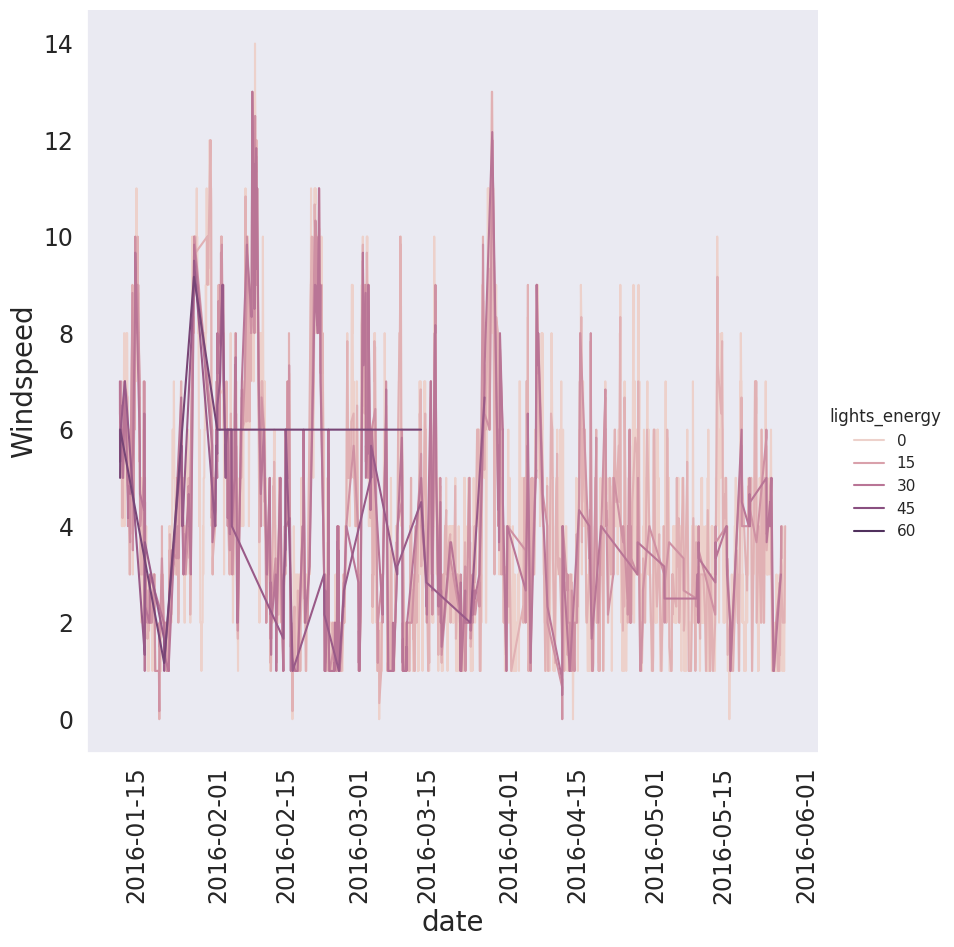

<Figure size 1000x1000 with 0 Axes>

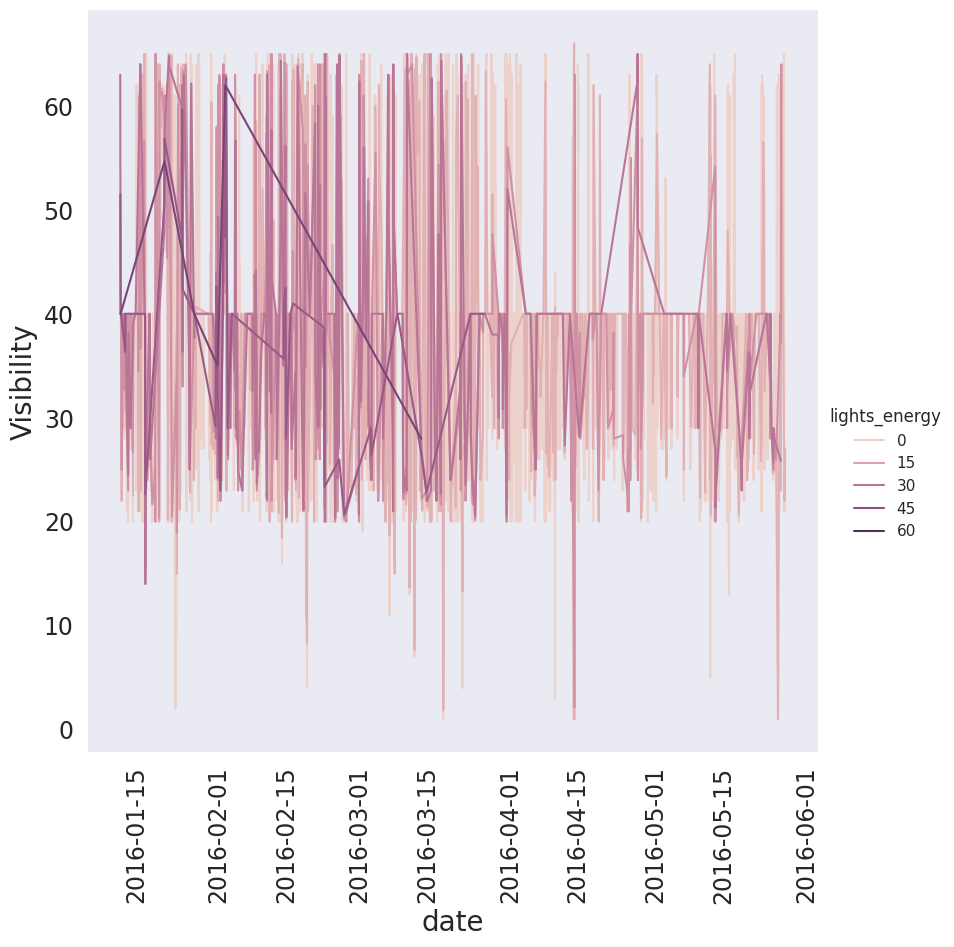

<Figure size 1000x1000 with 0 Axes>

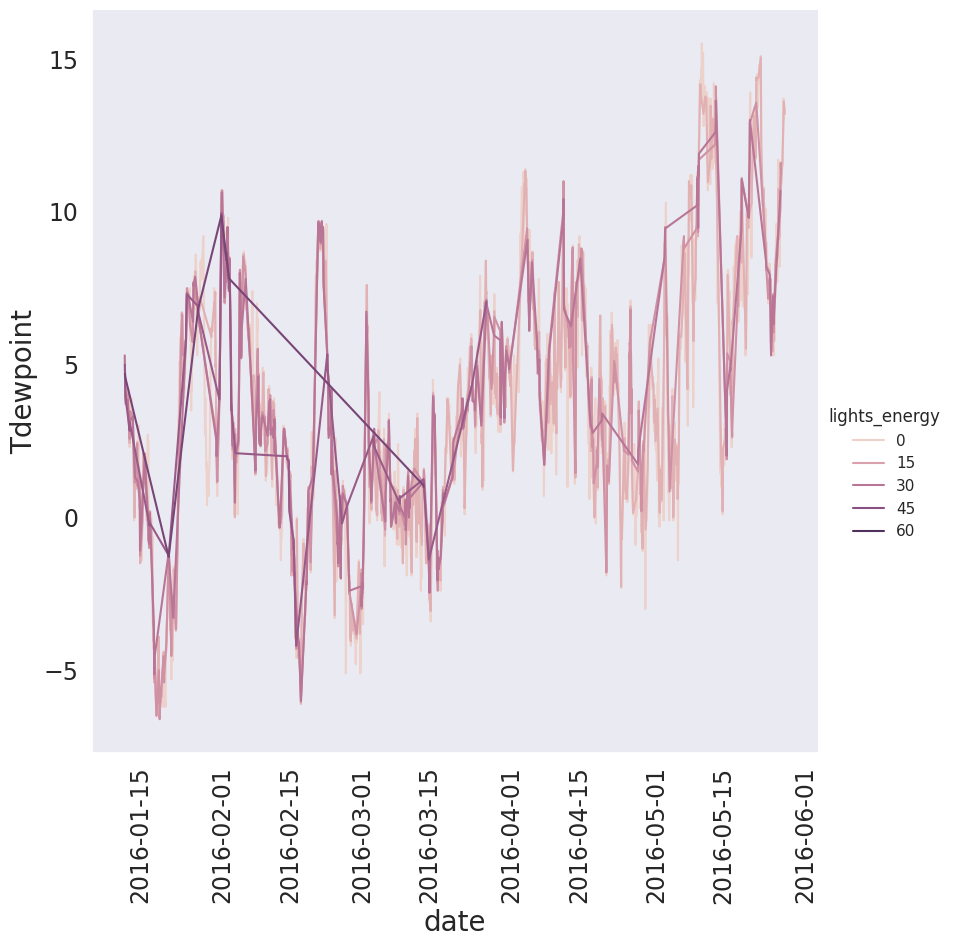

<Figure size 1000x1000 with 0 Axes>

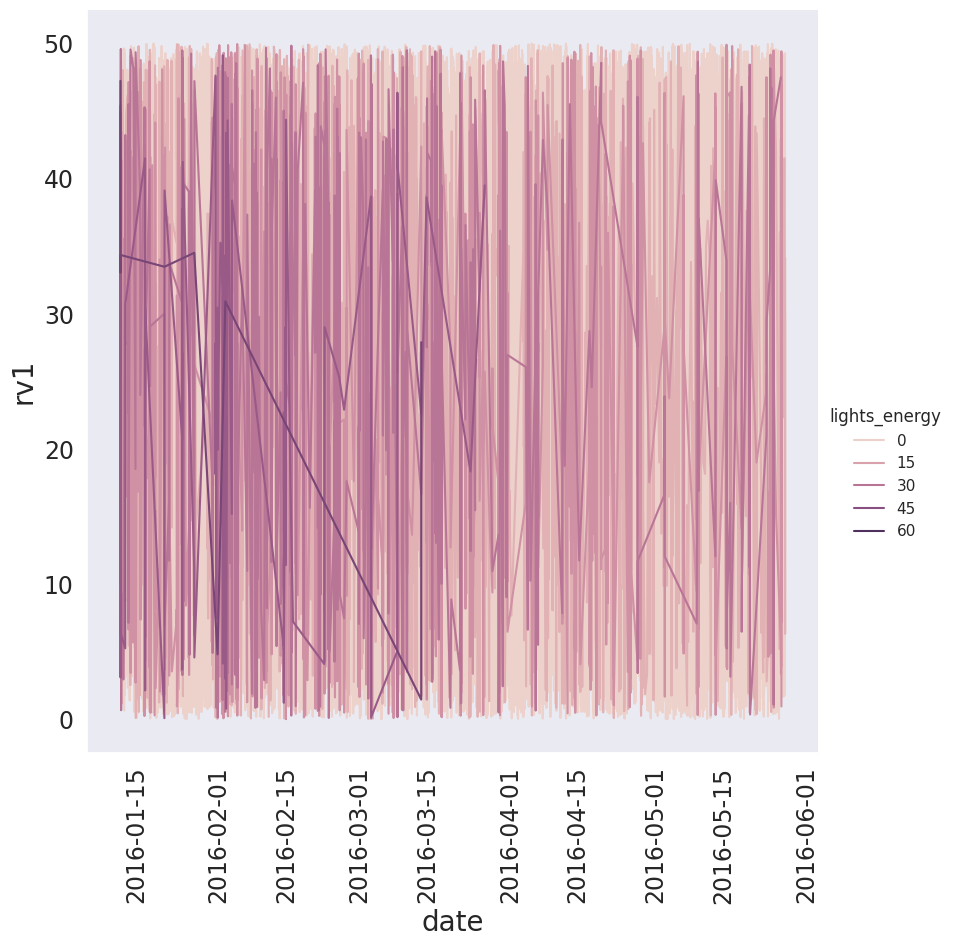

<Figure size 1000x1000 with 0 Axes>

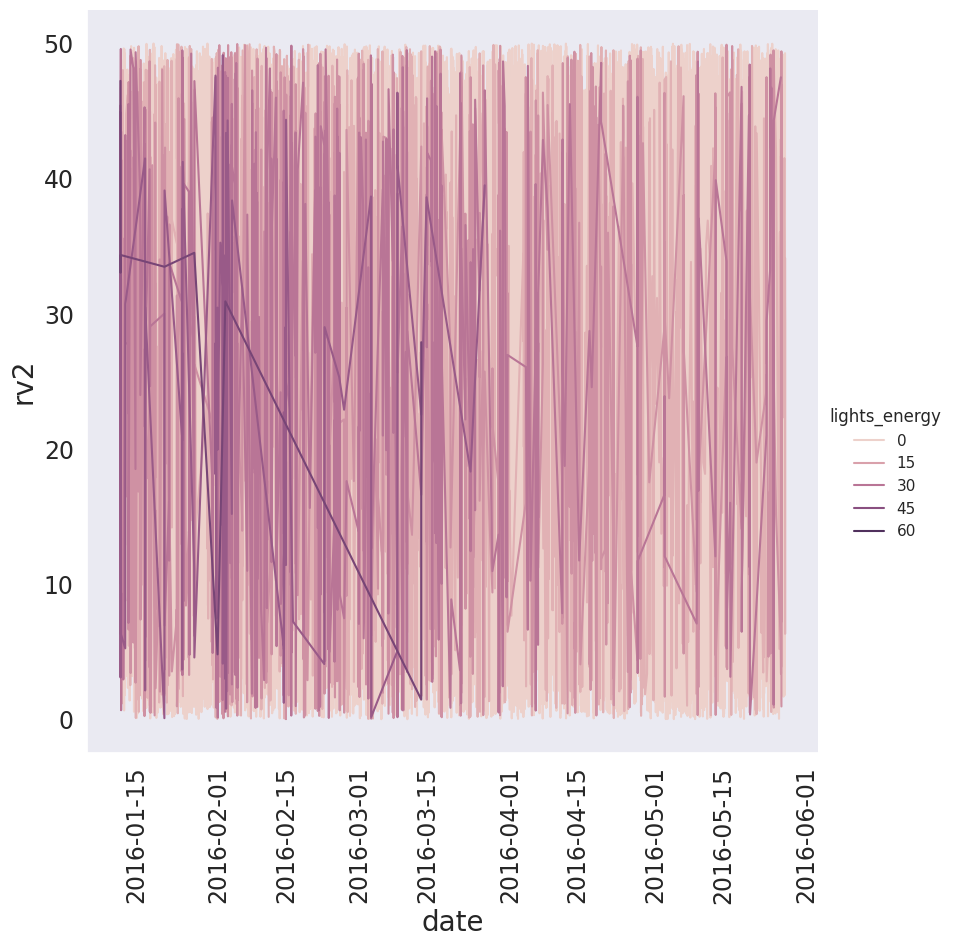

In [ ]:
# Combining lineplots using relplot
for i in df.columns[3:]:
    plt.figure(figsize=(10,10))
    sns.relplot(x="date" , y=i , hue="lights_energy",kind='line', height=8.5, aspect=1 ,data=df)
    plt.xticks(rotation=90) # Rotating X tickts by 45 degrees
    plt.show()

<Figure size 1000x1000 with 0 Axes>

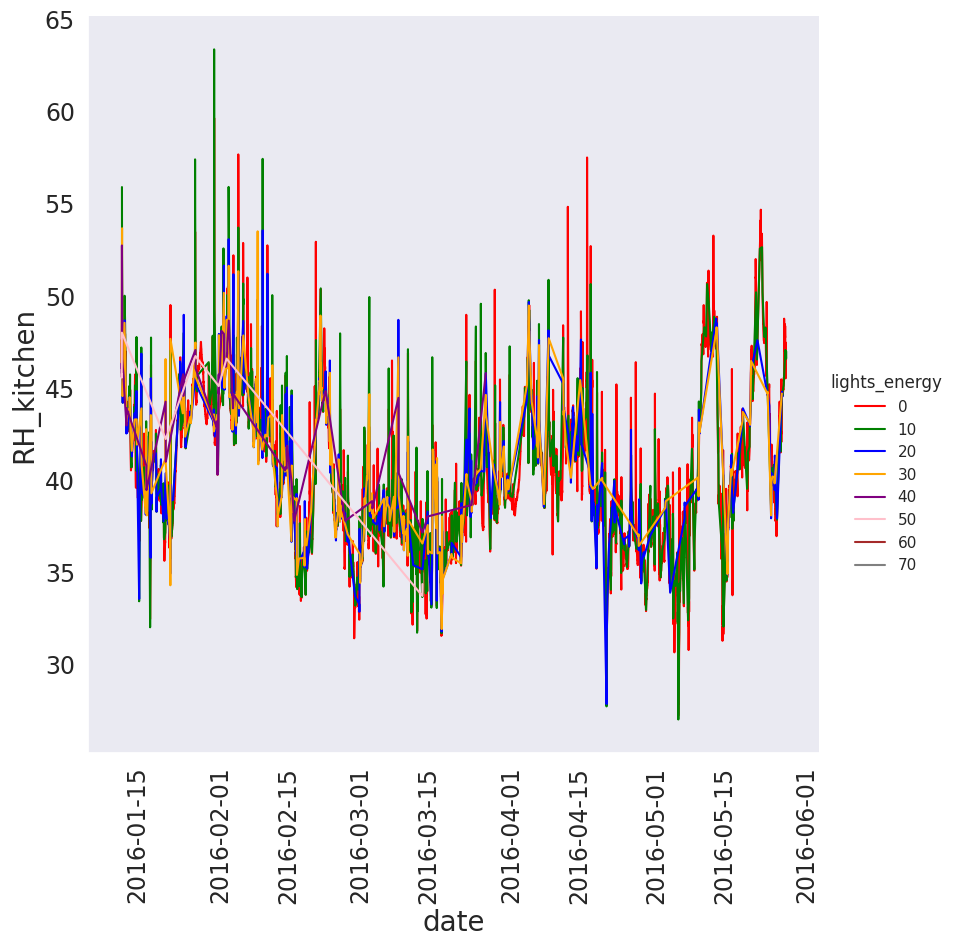

<Figure size 1000x1000 with 0 Axes>

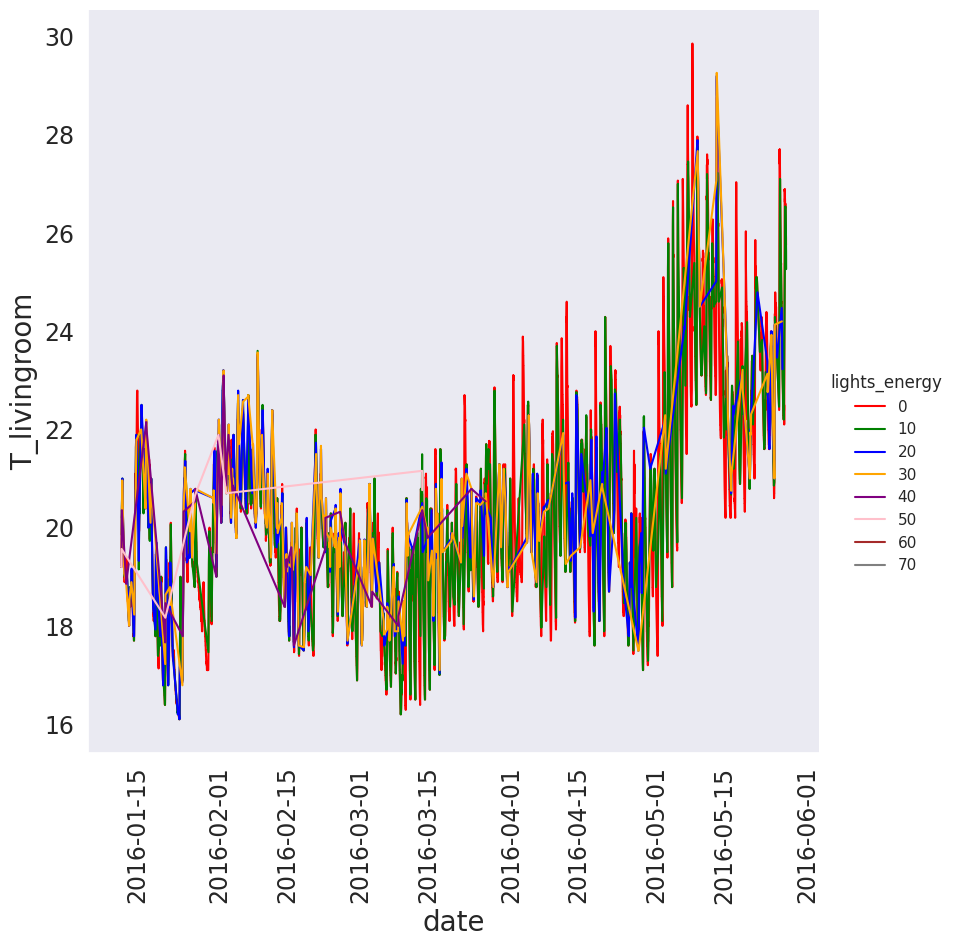

<Figure size 1000x1000 with 0 Axes>

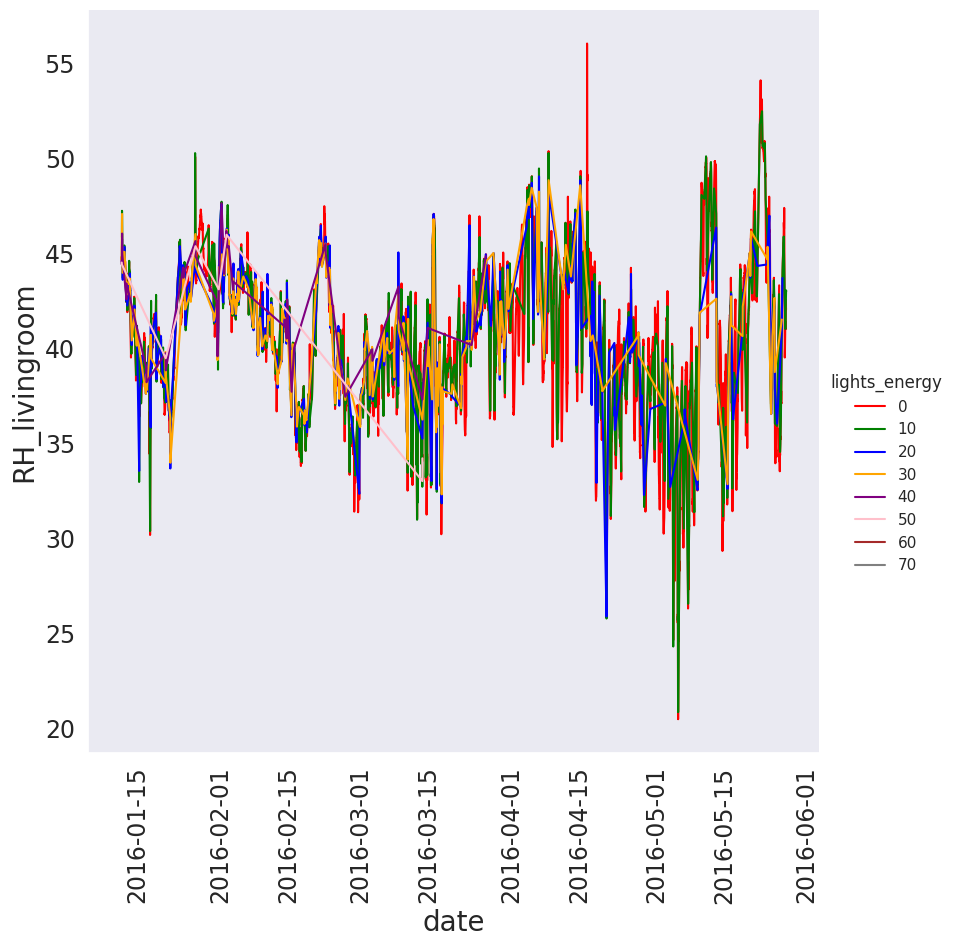

<Figure size 1000x1000 with 0 Axes>

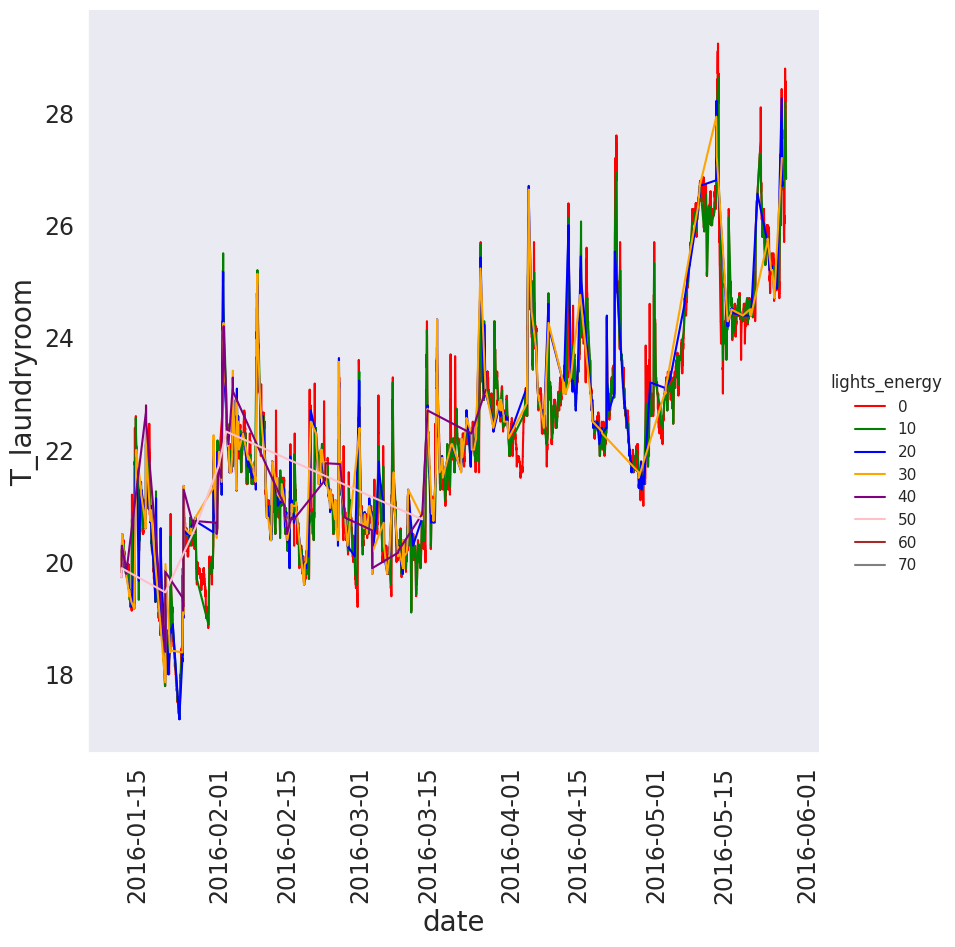

<Figure size 1000x1000 with 0 Axes>

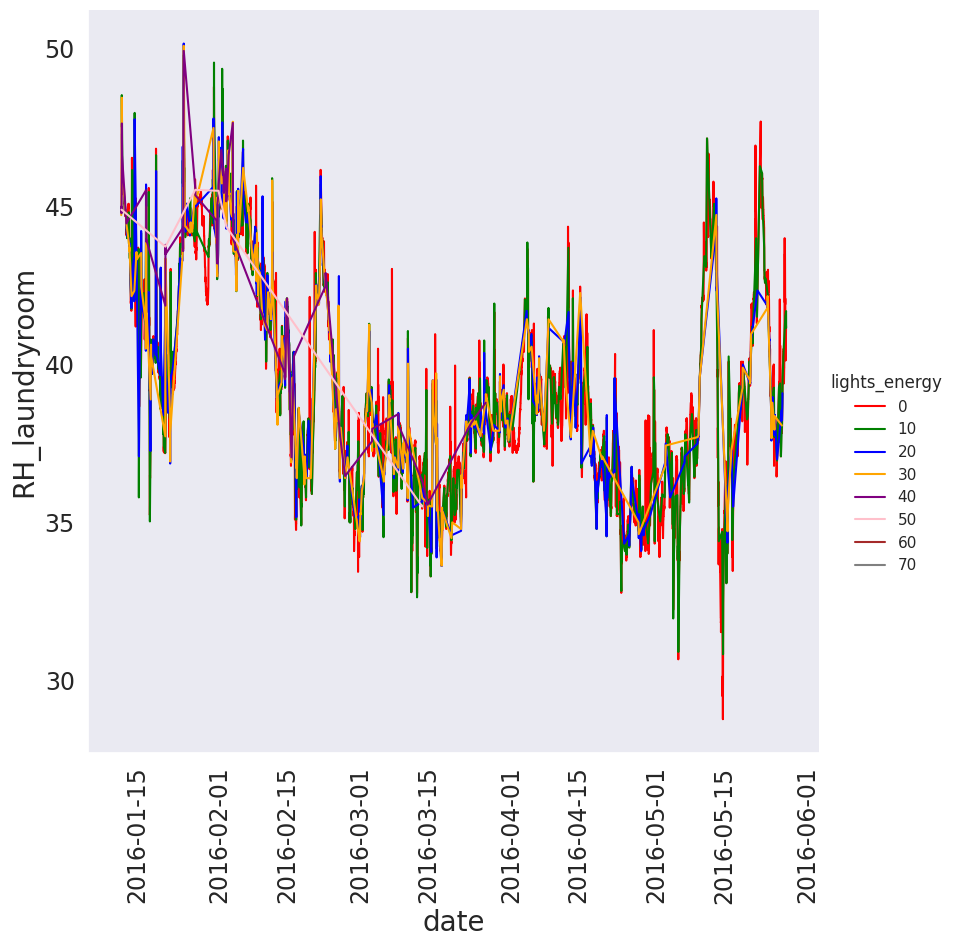

<Figure size 1000x1000 with 0 Axes>

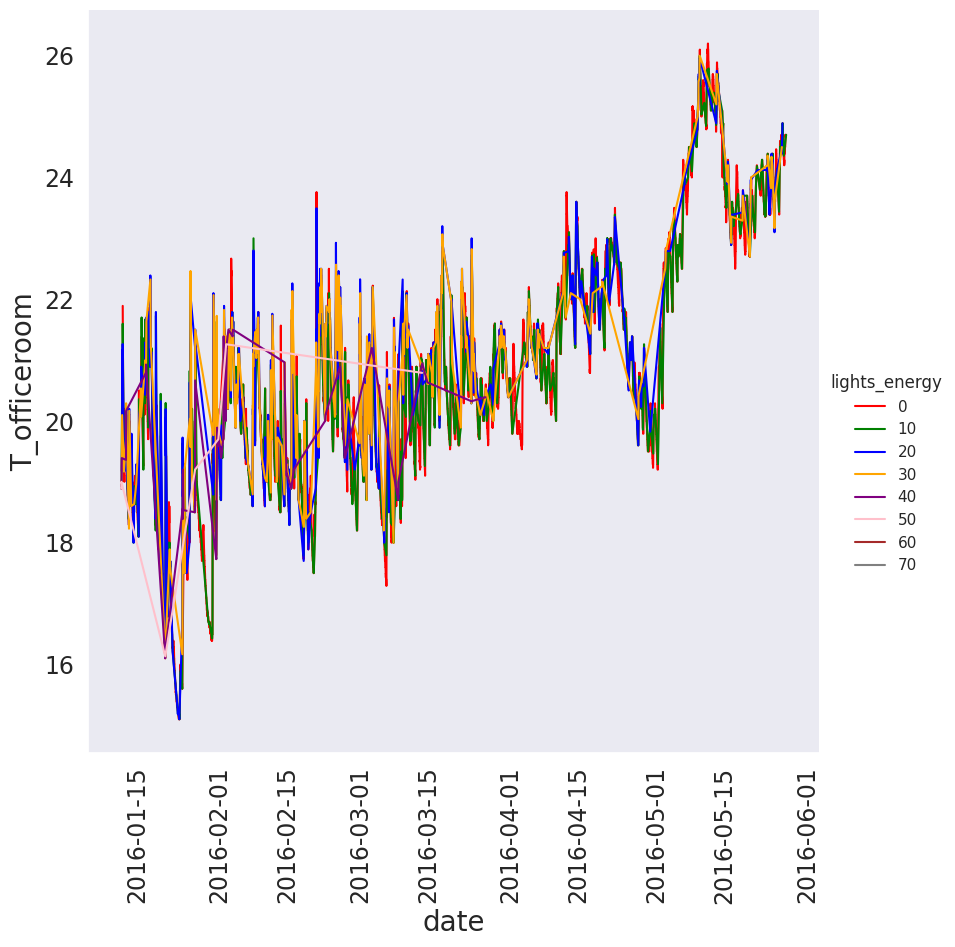

<Figure size 1000x1000 with 0 Axes>

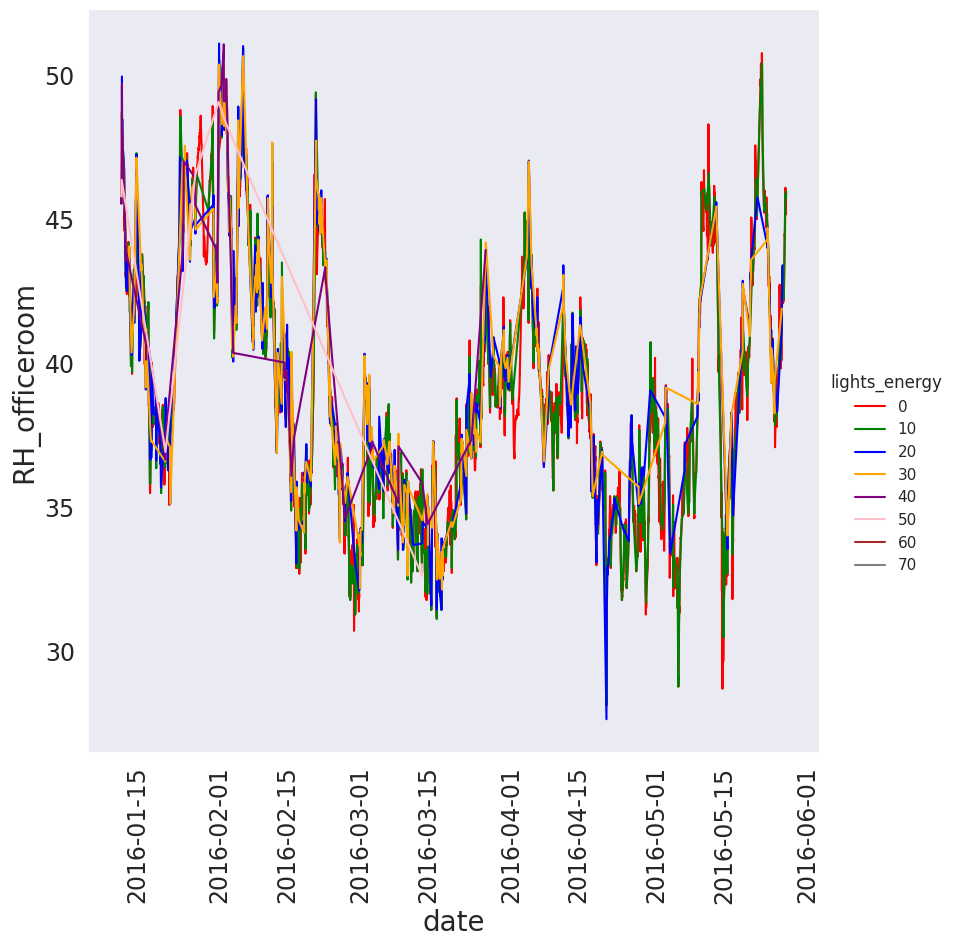

<Figure size 1000x1000 with 0 Axes>

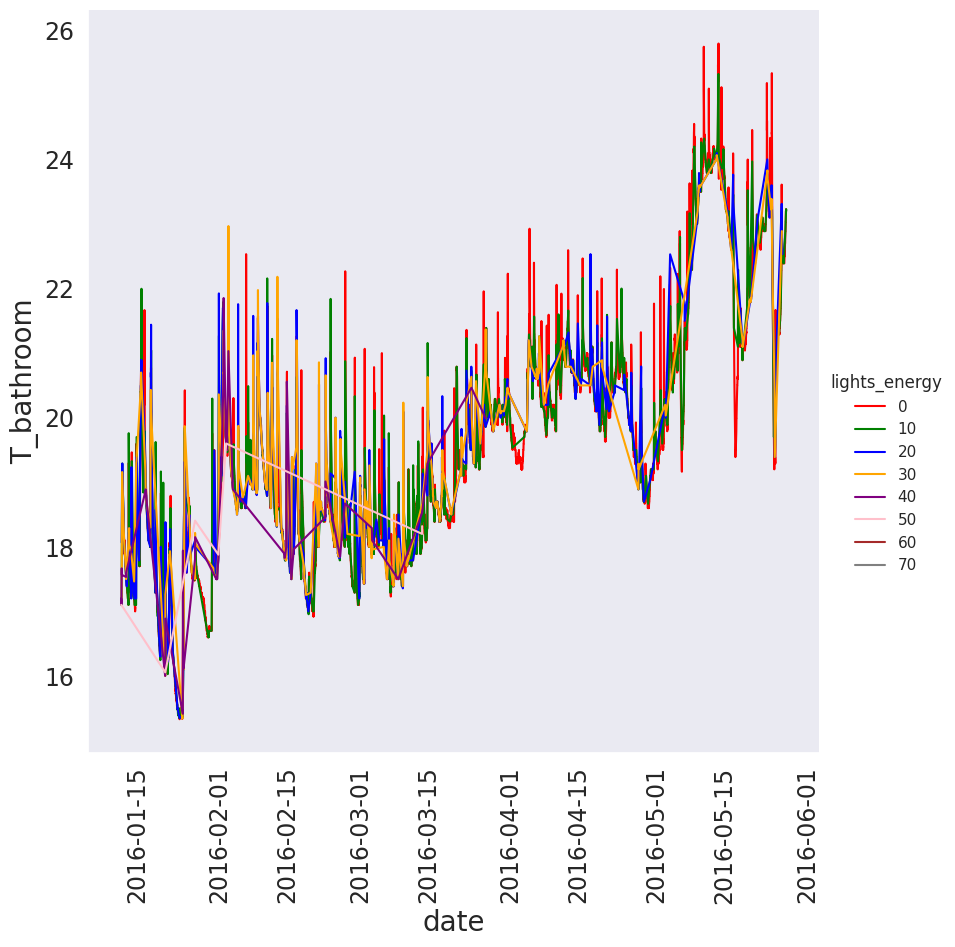

<Figure size 1000x1000 with 0 Axes>

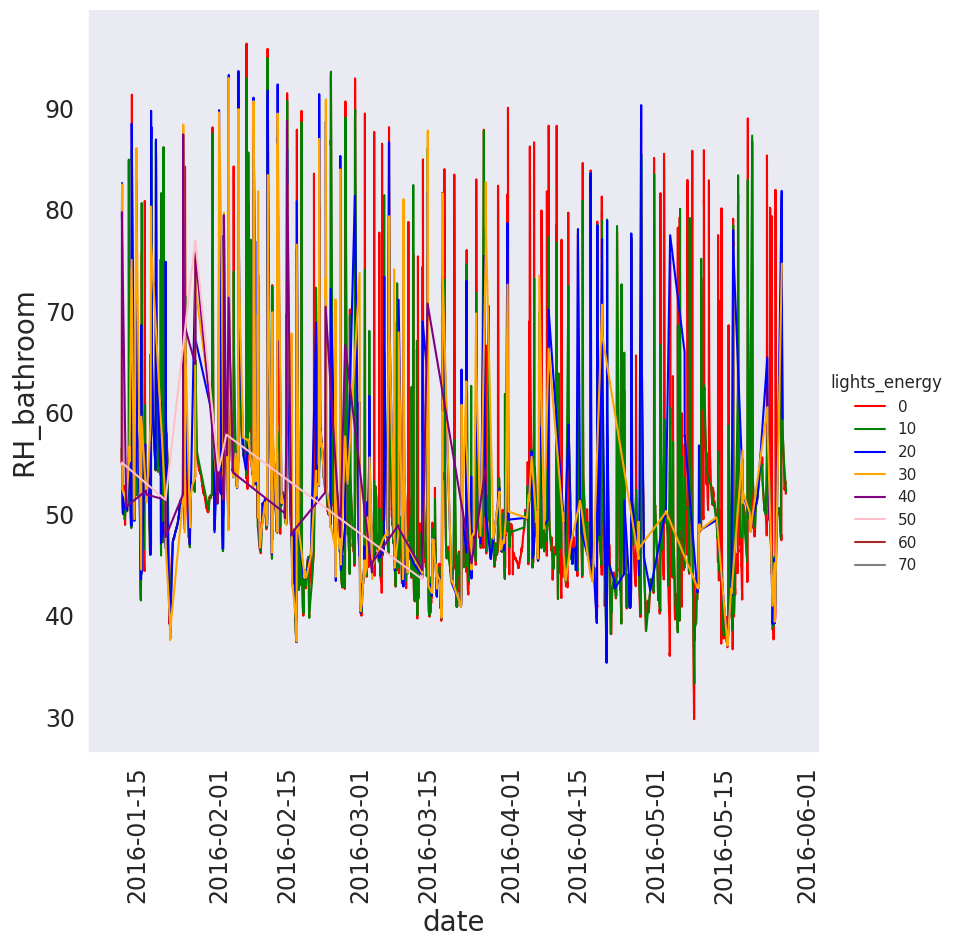

<Figure size 1000x1000 with 0 Axes>

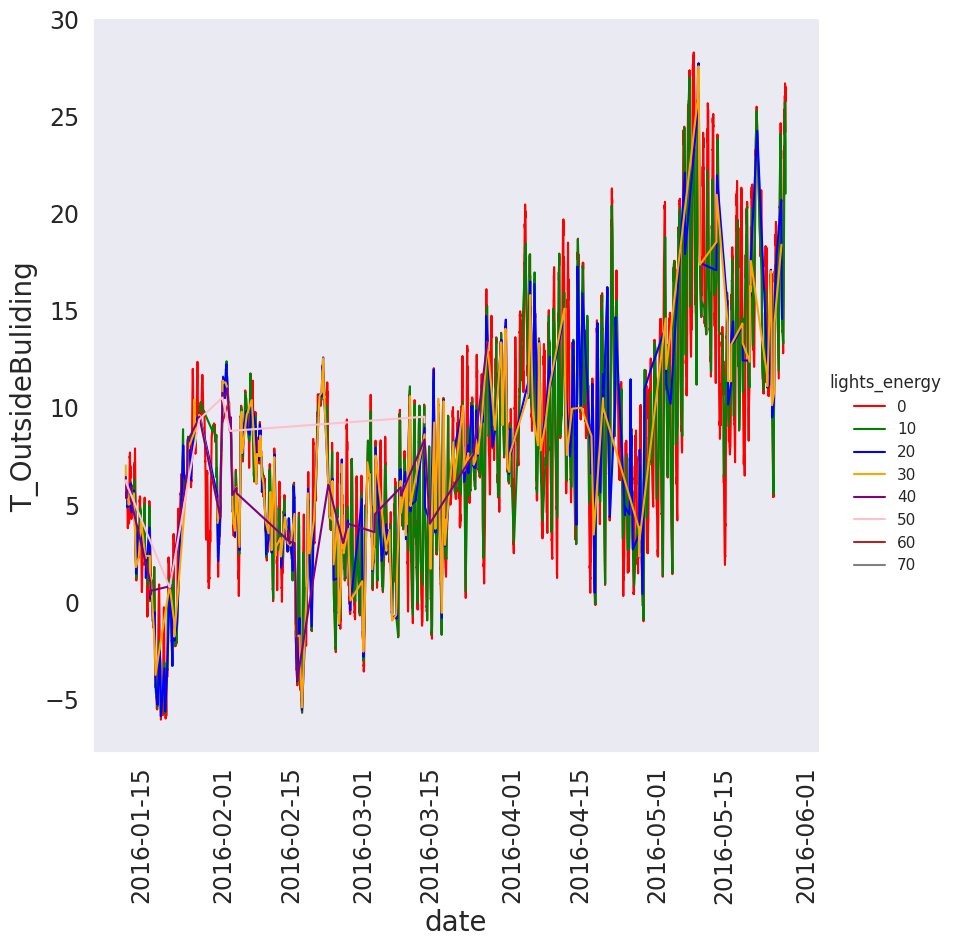

<Figure size 1000x1000 with 0 Axes>

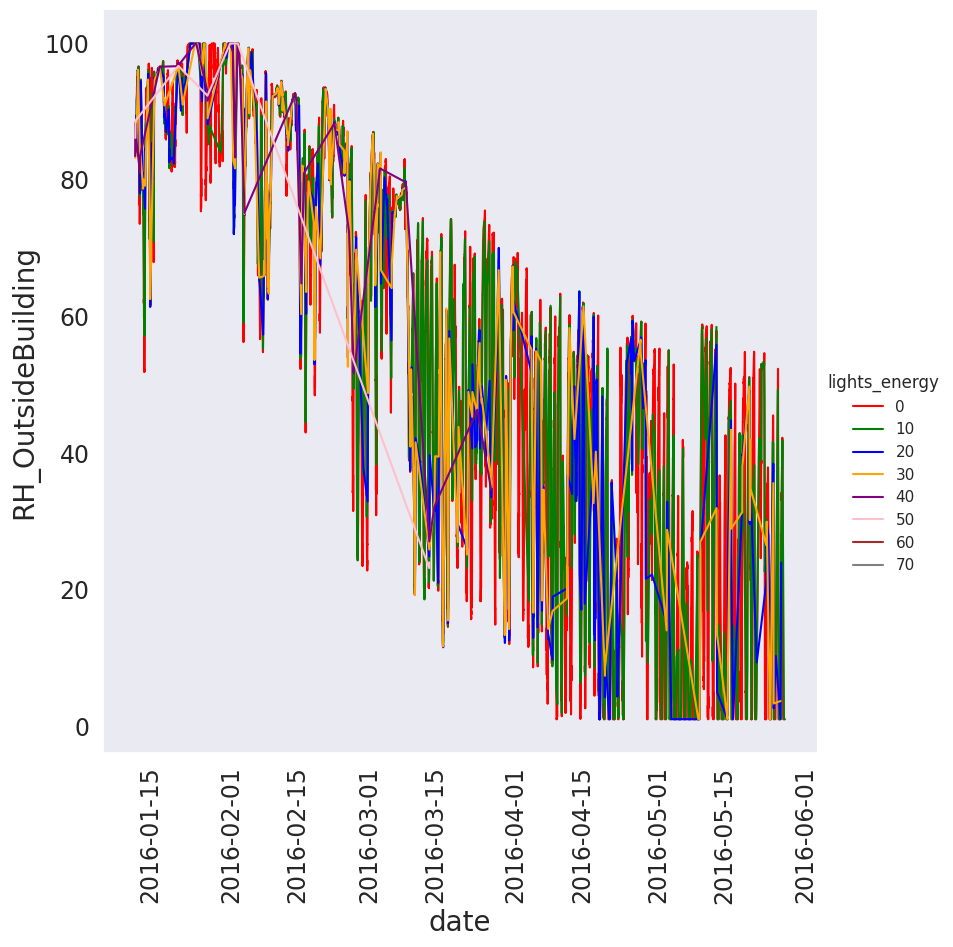

<Figure size 1000x1000 with 0 Axes>

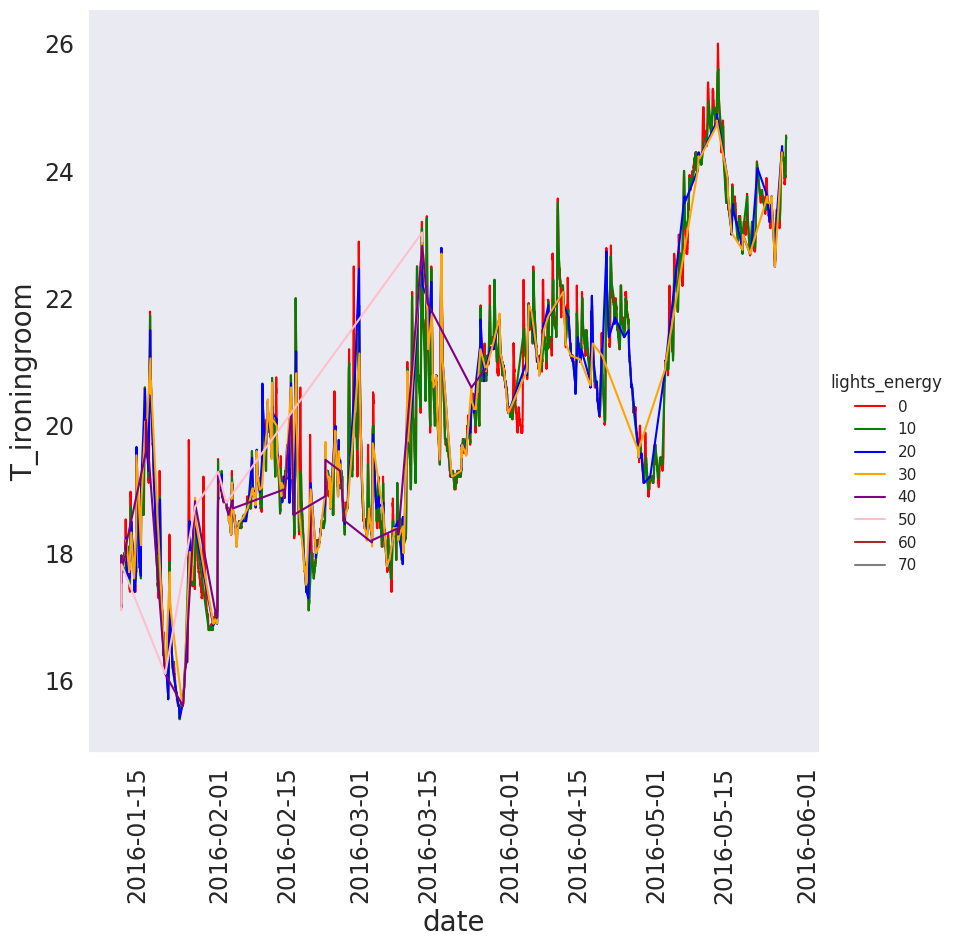

<Figure size 1000x1000 with 0 Axes>

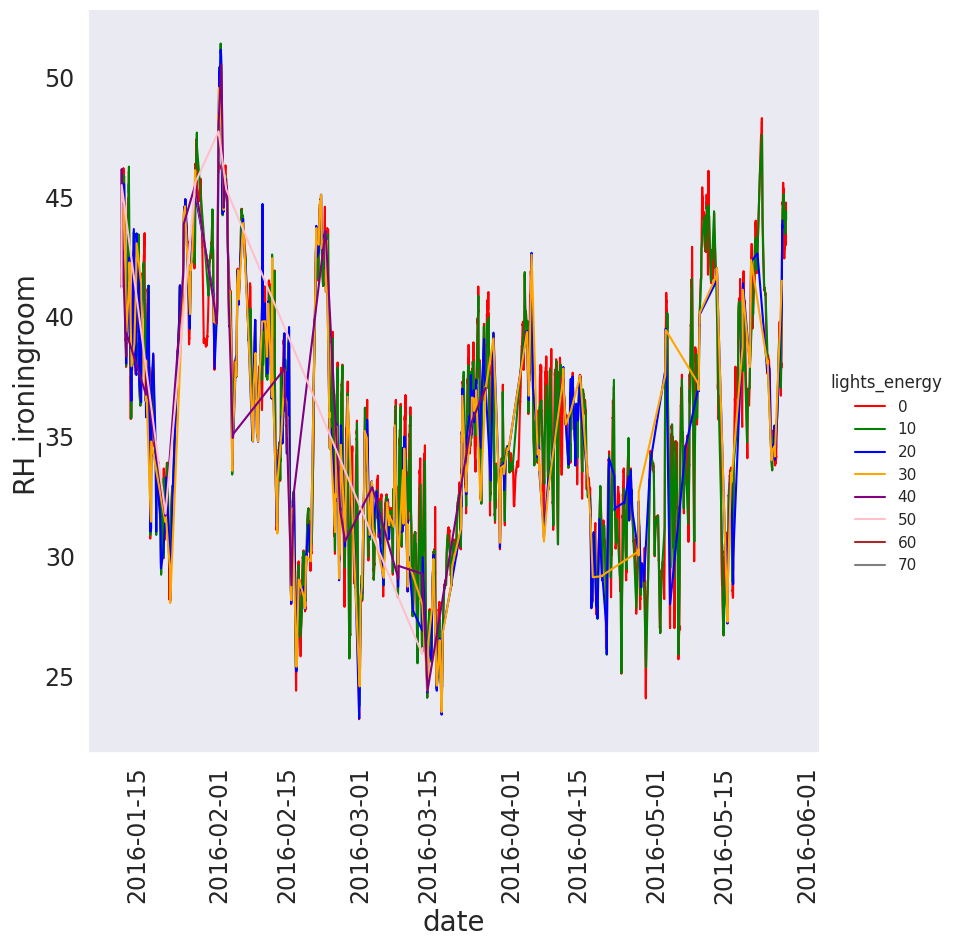

<Figure size 1000x1000 with 0 Axes>

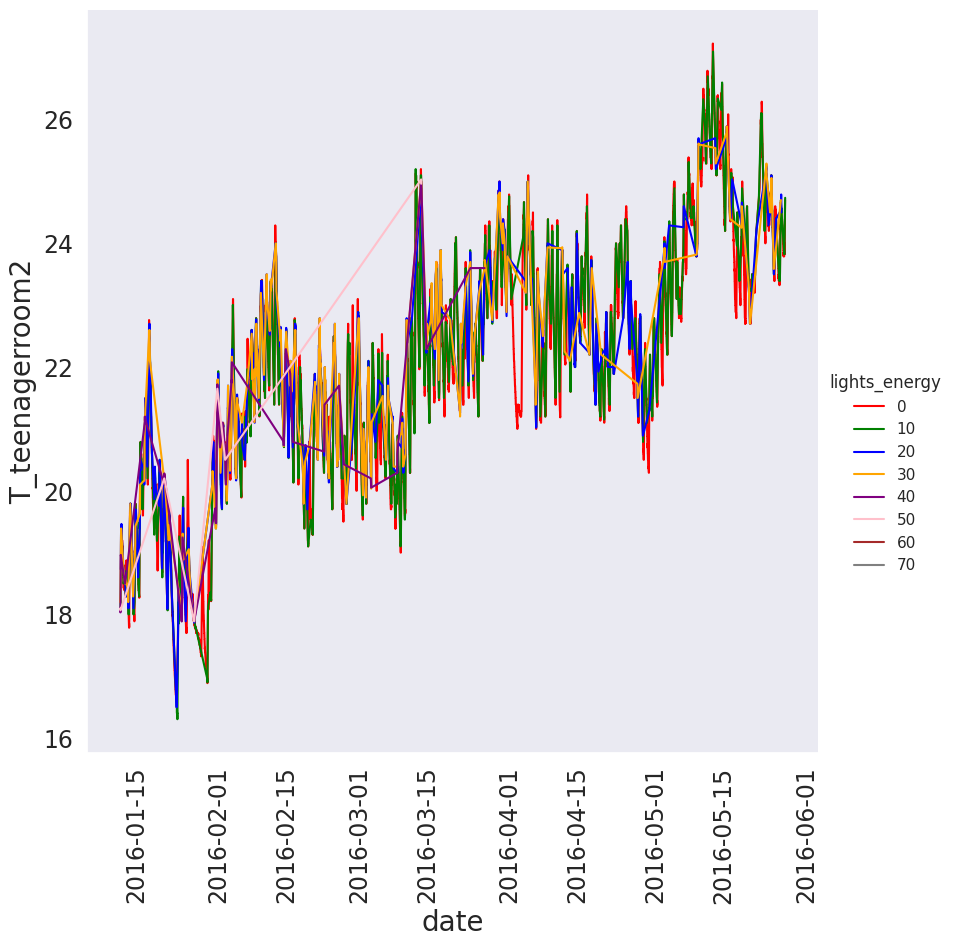

<Figure size 1000x1000 with 0 Axes>

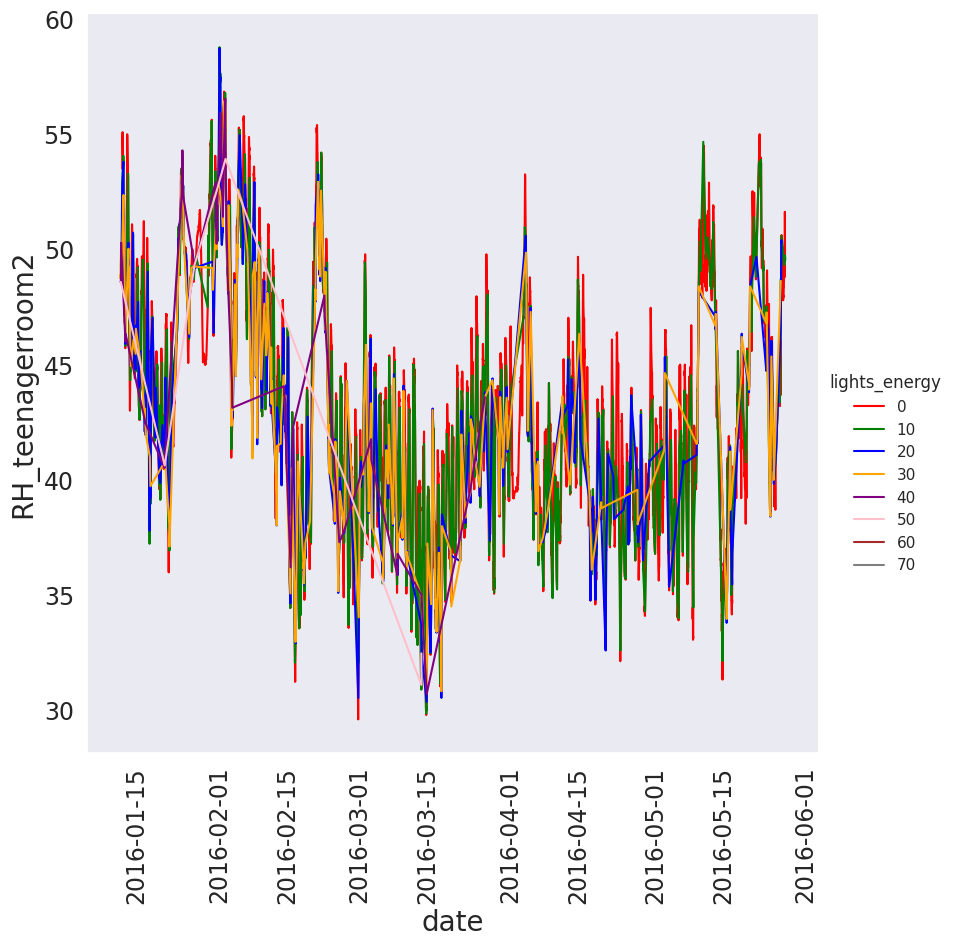

<Figure size 1000x1000 with 0 Axes>

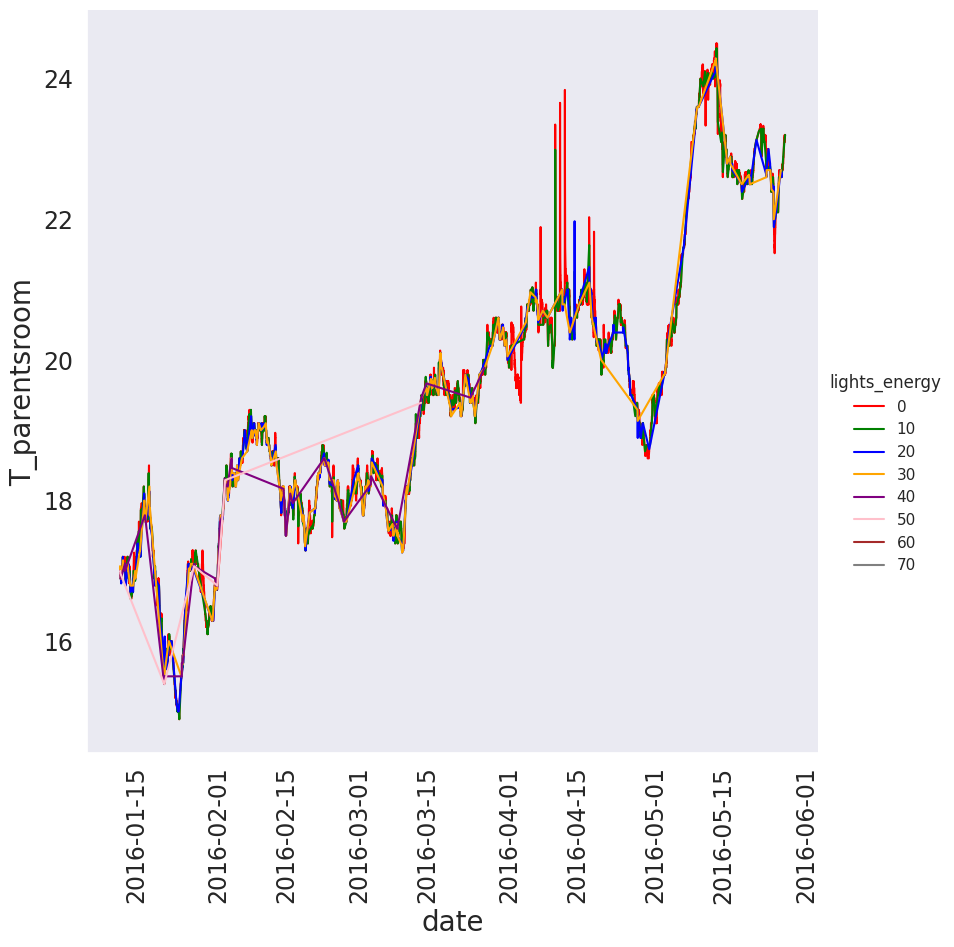

<Figure size 1000x1000 with 0 Axes>

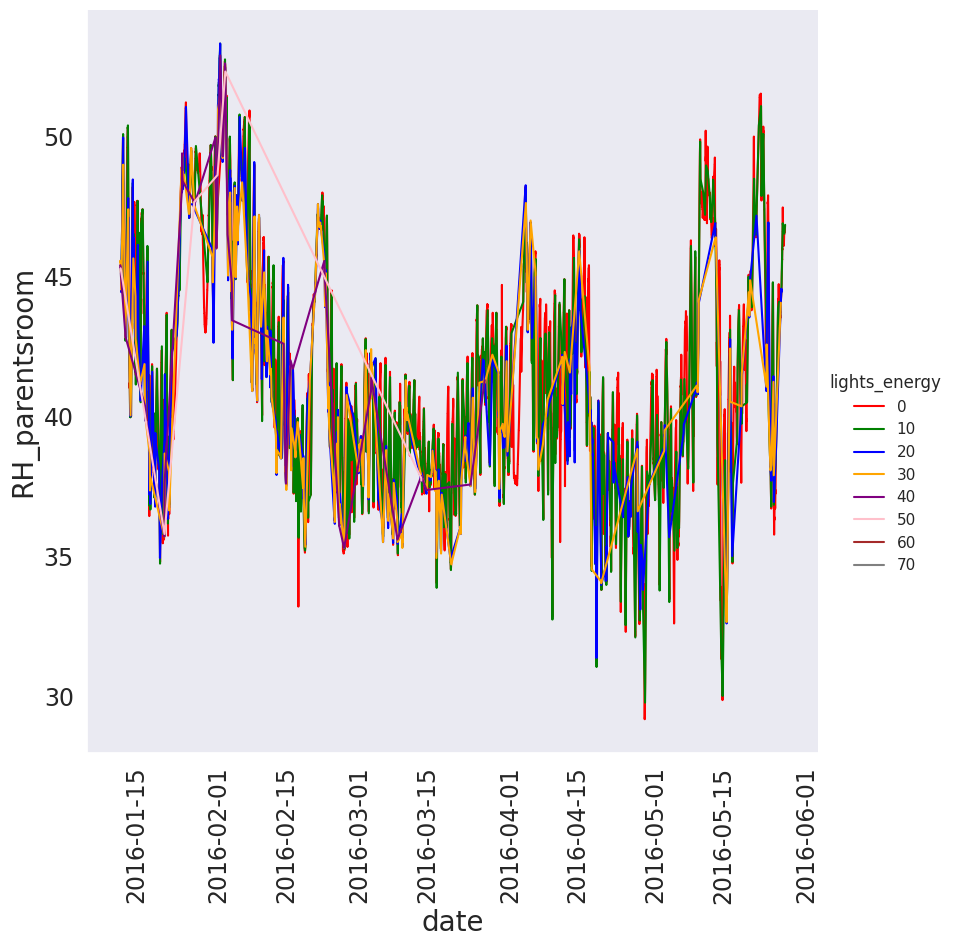

<Figure size 1000x1000 with 0 Axes>

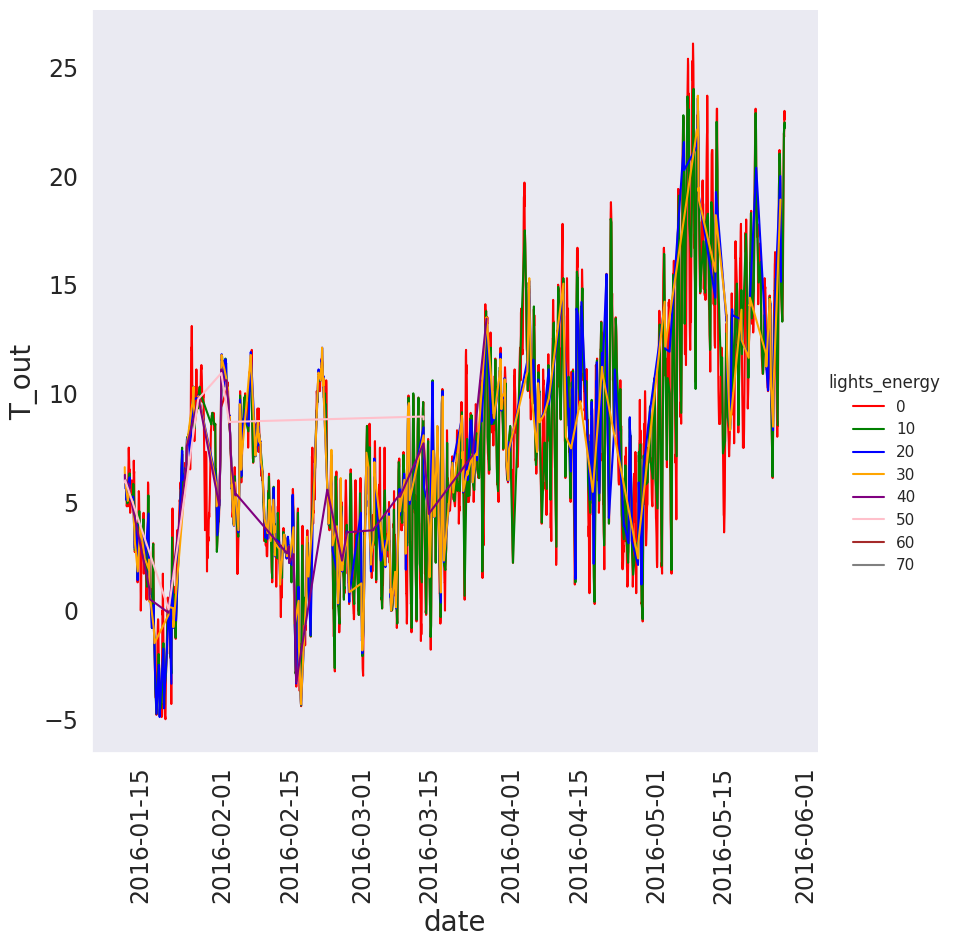

<Figure size 1000x1000 with 0 Axes>

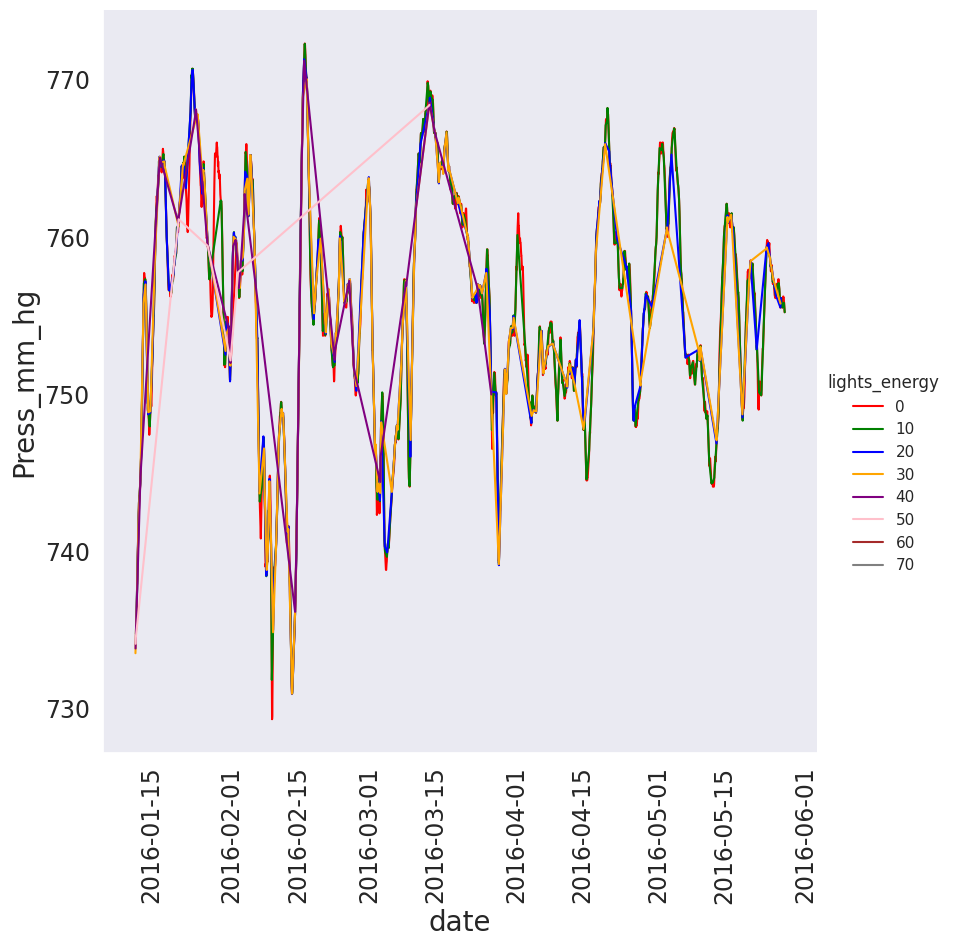

<Figure size 1000x1000 with 0 Axes>

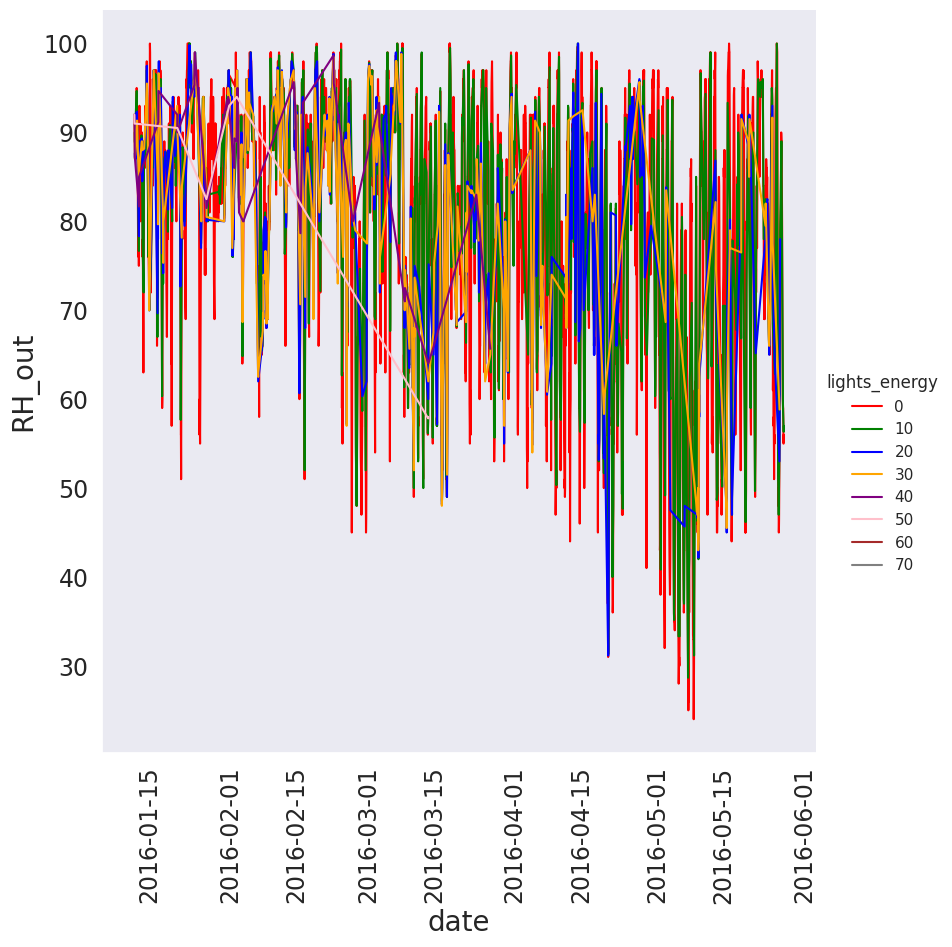

<Figure size 1000x1000 with 0 Axes>

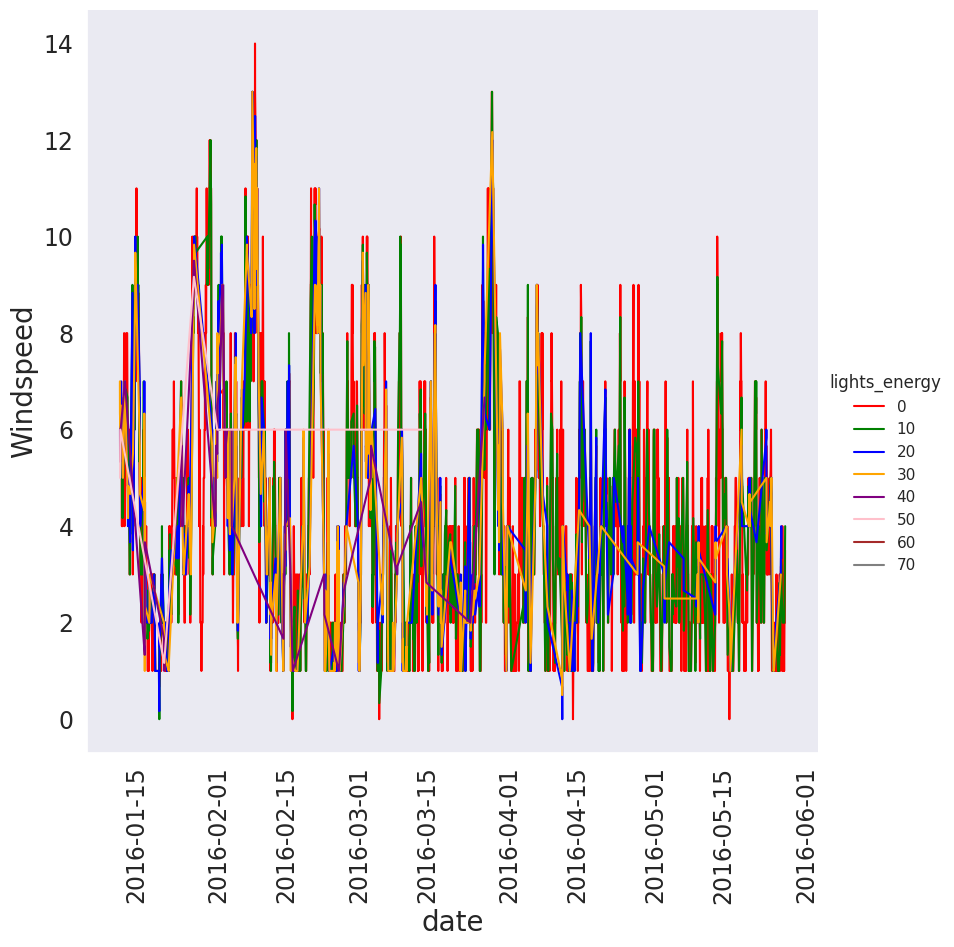

<Figure size 1000x1000 with 0 Axes>

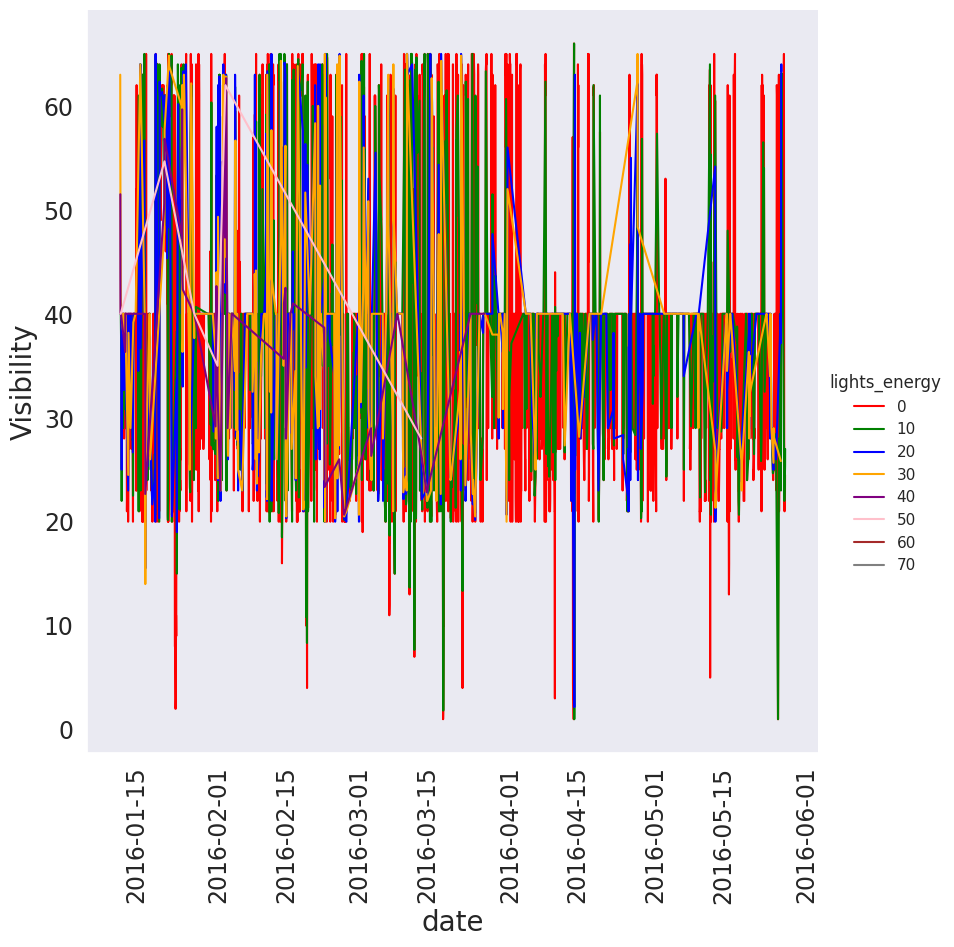

<Figure size 1000x1000 with 0 Axes>

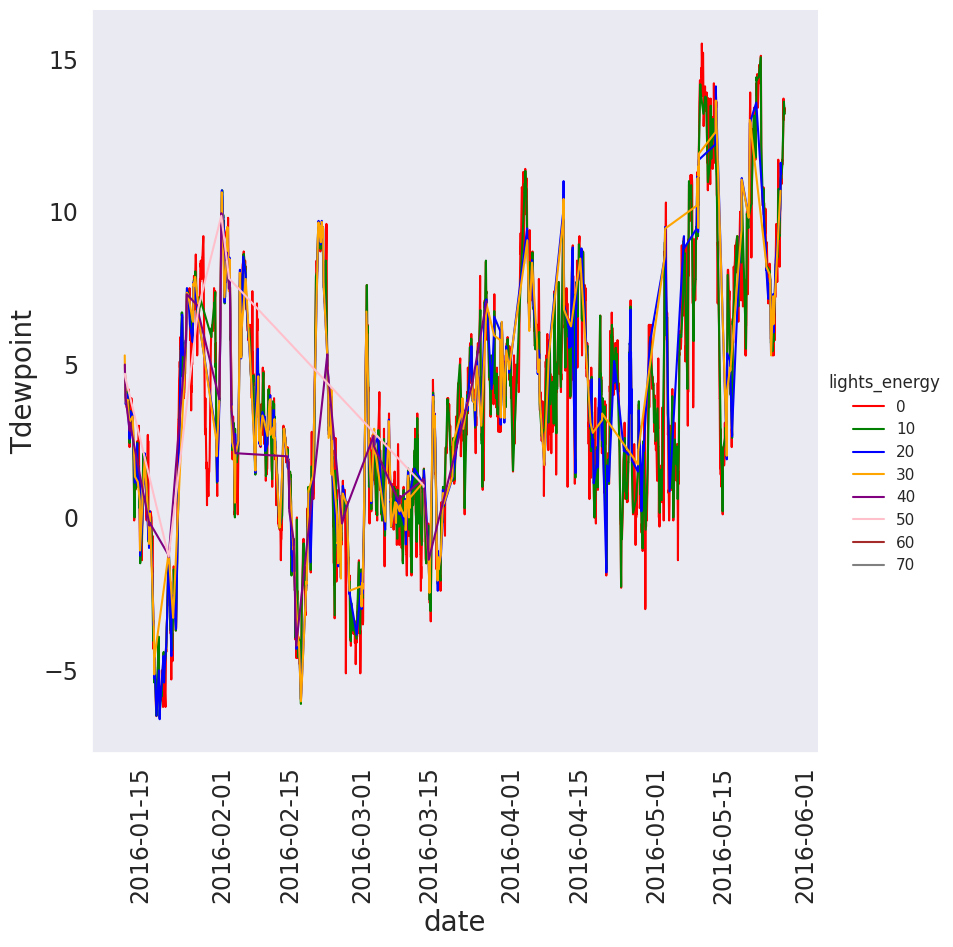

<Figure size 1000x1000 with 0 Axes>

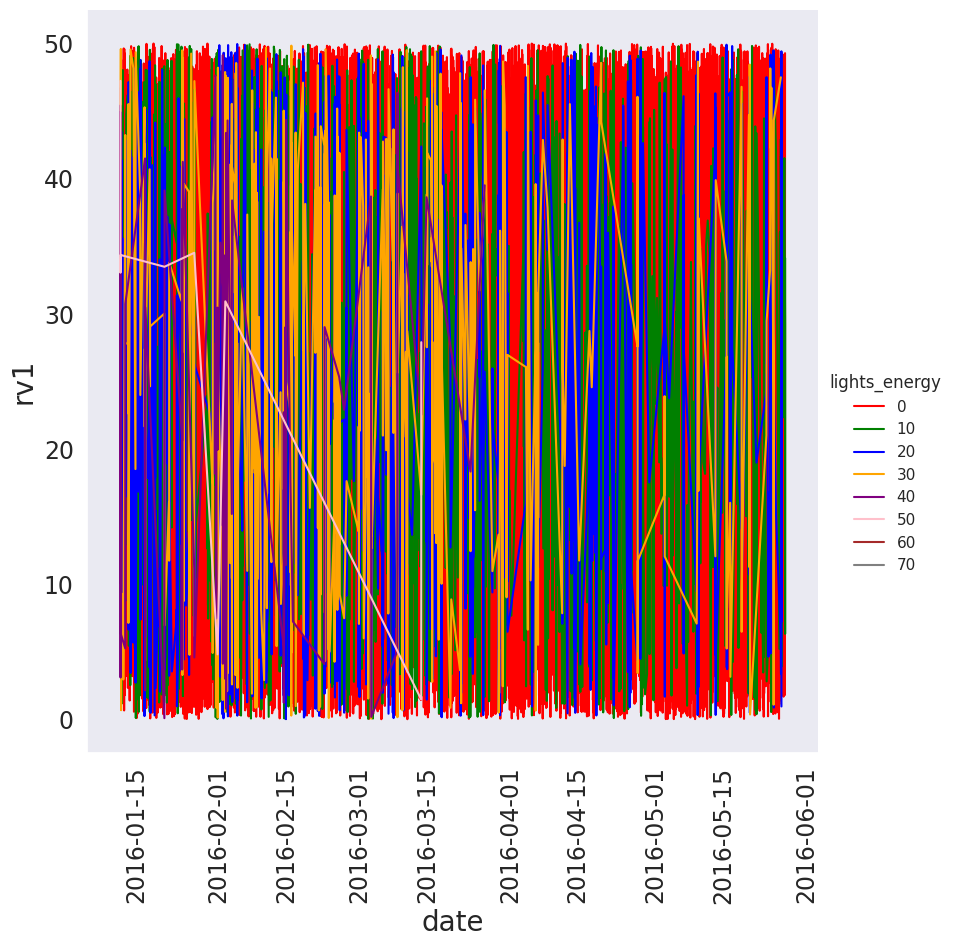

<Figure size 1000x1000 with 0 Axes>

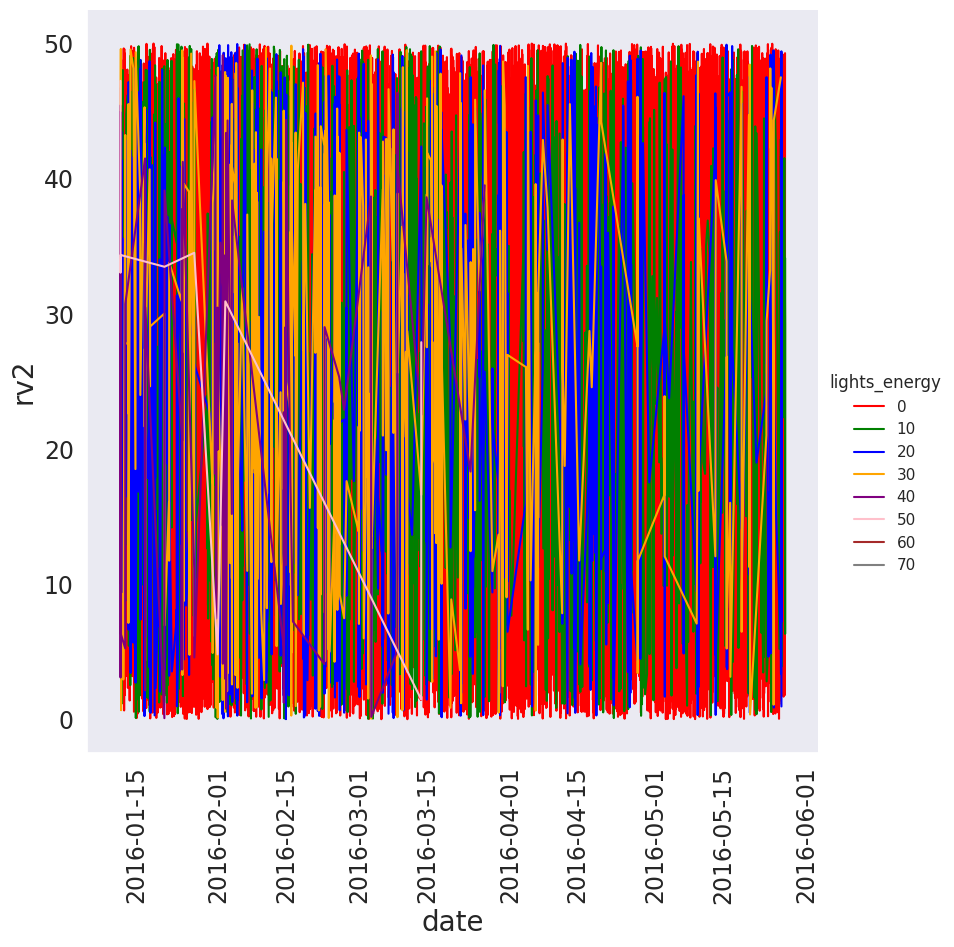

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a dictionary to map unique values in lights_energy to specific colors
color_mapping = {
    0: "red",
    10: "green",
    20: "blue",
    30: "orange",
    40: "purple",
    50: "pink",
    60: "brown",
    70: "gray",
    # Add more values and corresponding colors as needed
}

# Loop through the columns and create lineplots
for i in df.columns[3:]:
    plt.figure(figsize=(10, 10))
    sns.relplot(
        x="date",
        y=i,
        hue="lights_energy",
        kind='line',
        height=8.5,
        aspect=1,
        data=df,
        palette=color_mapping,  # Use the manually specified color mapping
    )
    plt.xticks(rotation=90)
    plt.show()


In [ ]:
df.set_index('date',inplace = True)

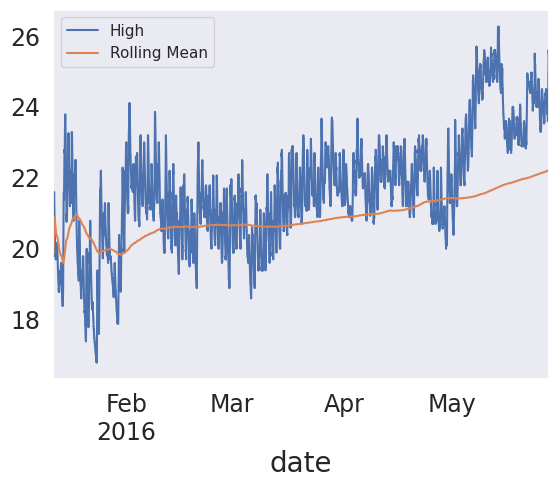

In [ ]:
# Rolling window functions
rolling_kitchen = df['T_kitchen'].rolling('90D').mean()
df['T_kitchen'].plot()
rolling_kitchen.plot()
plt.legend(['High','Rolling Mean'])
# Plotting a rolling mean of 90 day window with original High attribute of google stocks
plt.show()

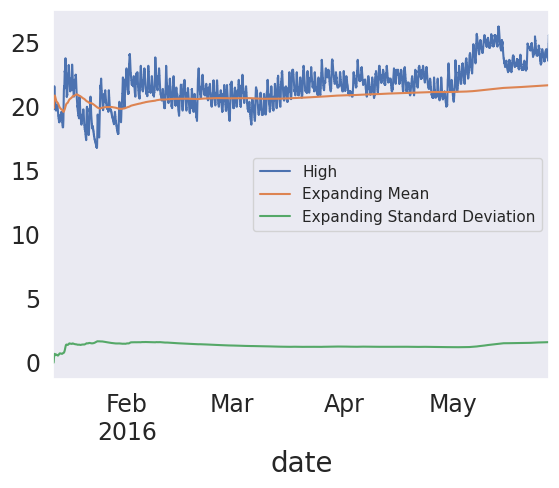

In [ ]:
T_kitchen_mean = df.T_kitchen.expanding().mean()
T_kitchen_std = df.T_kitchen.expanding().std()
df.T_kitchen.plot()
T_kitchen_mean.plot()
T_kitchen_std.plot()
plt.legend(['High','Expanding Mean','Expanding Standard Deviation'])
plt.show()
